<h1> Imports: </h1>
<p> We used a virtual environment to run this notebook, since there are a few modules we use that you may not want global. </p>
<p> Be sure to pip install: </p>
<p> ipynb </p>

<p> numpy </p>
<p> pandas </p>
<p> seaborn </p>
<p> matplotlib.pyplot </p>
<p> pandas_profiling </p>

<p> If you're using jupyter, you may not need to install those first four. It's still good to check. </p>


In [1]:
from ipynb.fs.full.converter import main_df
import os
import numpy as np
import pandas as pd
import pandas_profiling
import seaborn as sns
import matplotlib.pyplot as plt
from pandas.plotting import parallel_coordinates

<h3> Load in the CSV </h3>

In [2]:
df = pd.read_csv('heart_2020_cleaned.csv')

<h3> Load a pandas profile of the dataset </h3>
<p> These are full of useful information like correlations and interactions. </p>
<p> Starting with this is the best way to find interesting features to analyze. </p>

In [3]:
profile = df.profile_report()
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<h3> Let's load the dataframe just for fun. </h3>

In [4]:
df

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,No,16.60,Yes,No,No,3.0,30.0,No,Female,55-59,White,Yes,Yes,Very good,5.0,Yes,No,Yes
1,No,20.34,No,No,Yes,0.0,0.0,No,Female,80 or older,White,No,Yes,Very good,7.0,No,No,No
2,No,26.58,Yes,No,No,20.0,30.0,No,Male,65-69,White,Yes,Yes,Fair,8.0,Yes,No,No
3,No,24.21,No,No,No,0.0,0.0,No,Female,75-79,White,No,No,Good,6.0,No,No,Yes
4,No,23.71,No,No,No,28.0,0.0,Yes,Female,40-44,White,No,Yes,Very good,8.0,No,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319790,Yes,27.41,Yes,No,No,7.0,0.0,Yes,Male,60-64,Hispanic,Yes,No,Fair,6.0,Yes,No,No
319791,No,29.84,Yes,No,No,0.0,0.0,No,Male,35-39,Hispanic,No,Yes,Very good,5.0,Yes,No,No
319792,No,24.24,No,No,No,0.0,0.0,No,Female,45-49,Hispanic,No,Yes,Good,6.0,No,No,No
319793,No,32.81,No,No,No,0.0,0.0,No,Female,25-29,Hispanic,No,No,Good,12.0,No,No,No


In [5]:
df2 = df.copy()
df2['Patient_ID'] = df2.reset_index().index
heartcount=df2['HeartDisease'].groupby(df2["Race"]).value_counts(normalize= True)
smokecount = df2['Smoking'].groupby(df2["Race"]).value_counts(normalize= True)
alccount = df2['AlcoholDrinking'].groupby(df2["Race"]).value_counts(normalize= True)
strokecount= df2['Stroke'].groupby(df2["Race"]).value_counts(normalize= True)
diabeticcount = df2['Diabetic'].groupby(df2["Race"]).value_counts(normalize= True)
asthmacount = df2['Asthma'].groupby(df2["Race"]).value_counts(normalize= True)
kidneyacount = df2['KidneyDisease'].groupby(df2["Race"]).value_counts(normalize= True)
skincount = df2['SkinCancer'].groupby(df2["Race"]).value_counts(normalize= True)
diffwalkingcount = df2['DiffWalking'].groupby(df2["Race"]).value_counts(normalize= True)
activitycount = df2['PhysicalActivity'].groupby(df2["Race"]).value_counts(normalize= True)

In [6]:
RaceDisease = pd.concat([heartcount,smokecount, alccount , strokecount,diffwalkingcount, diabeticcount,activitycount,  asthmacount, kidneyacount, skincount ], axis=1)
RaceDisease = RaceDisease.dropna().reset_index()
RaceDisease.rename(columns = {"level_1": "Answer" }, inplace=True )
RaceDisease

,Race,Answer,HeartDisease,Smoking,AlcoholDrinking,Stroke,DiffWalking,Diabetic,PhysicalActivity,Asthma,KidneyDisease,SkinCancer
0,American Indian/Alaskan Native,No,0.895809,0.450980,0.940215,0.940984,0.793349,0.762784,0.282199,0.829489,0.952326,0.967320
1,American Indian/Alaskan Native,Yes,0.104191,0.549020,0.059785,0.059016,0.206651,0.196271,0.717801,0.170511,0.047674,0.032680
2,Asian,No,0.967030,0.772062,0.966782,0.981284,0.944596,0.849033,0.193233,0.901958,0.983019,0.993059
3,Asian,Yes,0.032970,0.227938,0.033218,0.018716,0.055404,0.096926,0.806767,0.098042,0.016981,0.006941
4,Black,No,0.924626,0.655260,0.955447,0.945246,0.811849,0.770914,0.290248,0.839836,0.956188,0.993984
5,Black,Yes,0.075374,0.344740,0.044553,0.054754,0.188151,0.194036,0.709752,0.160164,0.043812,0.006016
6,Hispanic,No,0.947424,0.694965,0.944691,0.978321,0.870400,0.828536,0.301683,0.861619,0.969905,0.984916
7,Hispanic,Yes,0.052576,0.305035,0.055309,0.021679,0.129600,0.132005,0.698317,0.138381,0.030095,0.015084
8,Other,No,0.918924,0.545113,0.924597,0.956442,0.845534,0.817533,0.220626,0.815154,0.965227,0.956076
9,Other,Yes,0.081076,0.454887,0.075403,0.043558,0.154466,0.134517,0.779374,0.184846,0.034773,0.043924


In [7]:
yes= []
no = []
race = RaceDisease["Race"].unique()
for x in RaceDisease.index:
    if RaceDisease.loc[x,"Answer"] == "Yes":
        yes.append(RaceDisease.loc[x,"HeartDisease"])
for x in RaceDisease.index:
    if RaceDisease.loc[x,"Answer"] == "No":
        no.append(RaceDisease.loc[x,"HeartDisease"])

yes

[0.10419069588619762,
 0.032969757064947945,
 0.07537381751602075,
 0.052575967354077095,
 0.08107613469985359,
 0.09178588323573071]

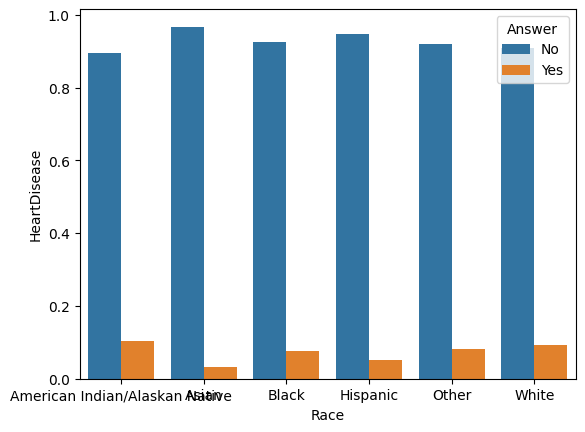

In [8]:
ax = sns.barplot(data=RaceDisease, x = "Race", y = "HeartDisease", hue= "Answer")

In [9]:
Age_Category =df2["AgeCategory"].unique()
Age_Category.sort()
Age_Category

array(['18-24', '25-29', '30-34', '35-39', '40-44', '45-49', '50-54',
       '55-59', '60-64', '65-69', '70-74', '75-79', '80 or older'],
      dtype=object)

In [10]:
count_race = df2.groupby("Race").count()[['Patient_ID']]
count_age = df2.groupby("AgeCategory").count()[['Patient_ID']]
count_sex = df2.groupby("Sex").count()[['Patient_ID']]

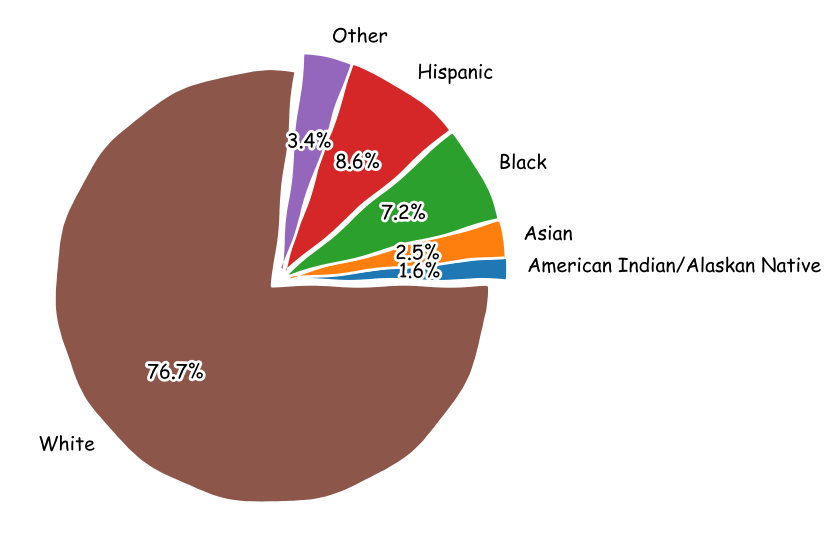

In [11]:
with plt.xkcd():
    plt.figure(figsize=(10,7))
    plt.pie(count_race["Patient_ID"],labels=count_race.index,explode=[.05 for _ in count_race.index], autopct="%1.1f%%")
    plt.show()

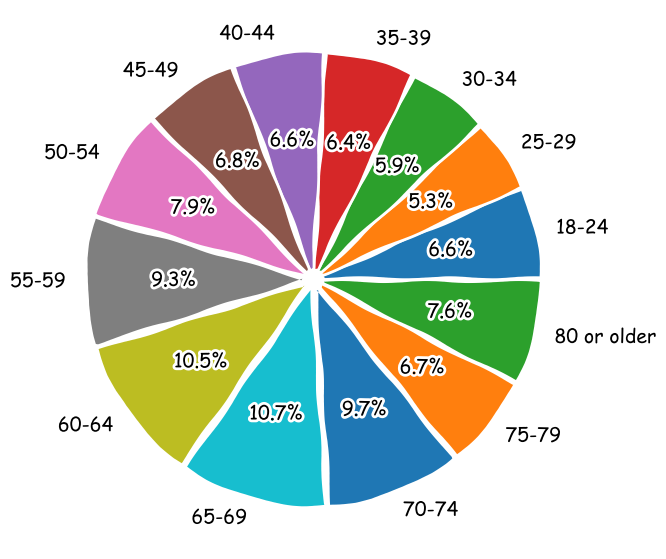

In [12]:
with plt.xkcd():
    plt.figure(figsize=(15,7))
    plt.pie(count_age["Patient_ID"],labels=count_age.index,explode=[.05 for _ in count_age.index], autopct="%1.1f%%")
    plt.show()

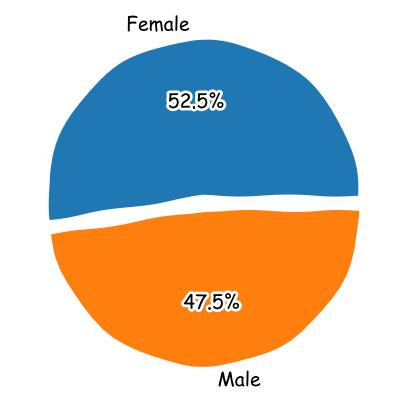

In [13]:
with plt.xkcd():
    plt.figure(figsize=(5,7))
    plt.pie(count_sex["Patient_ID"],labels=count_sex.index,explode=[.05 for _ in count_sex.index], autopct="%1.1f%%")
    plt.show()

<h3> Let's take another look at race with a distribution plot. </h3>

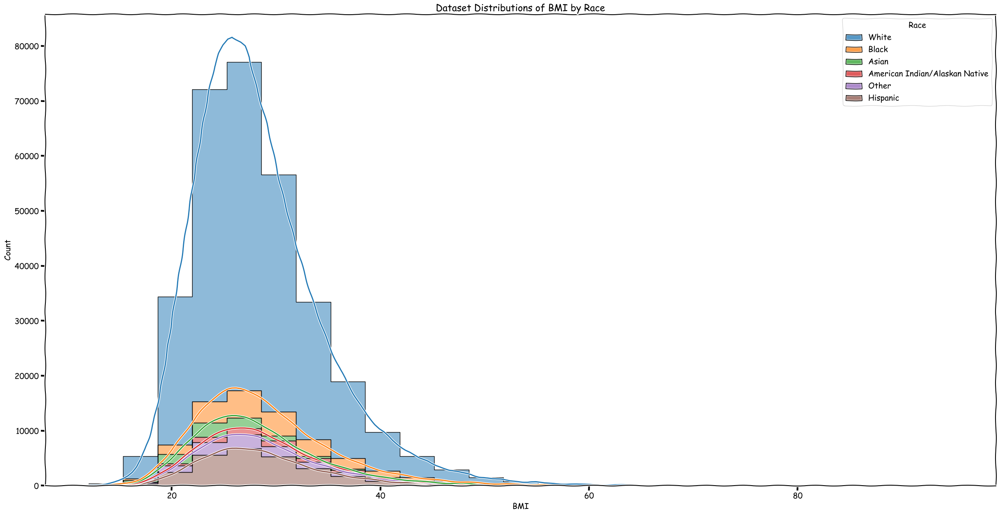

In [14]:
with plt.xkcd():
    plt.figure(figsize=(30, 15))
    sns.histplot(data=main_df, x="BMI", kde=True, hue="Race", multiple="stack", element="step", common_norm=True, bins=25)
    plt.title("Dataset Distributions of BMI by Race")
    plt.show()

<h3> We can make a 2d distribution plot as well, with any of our features. </h3>

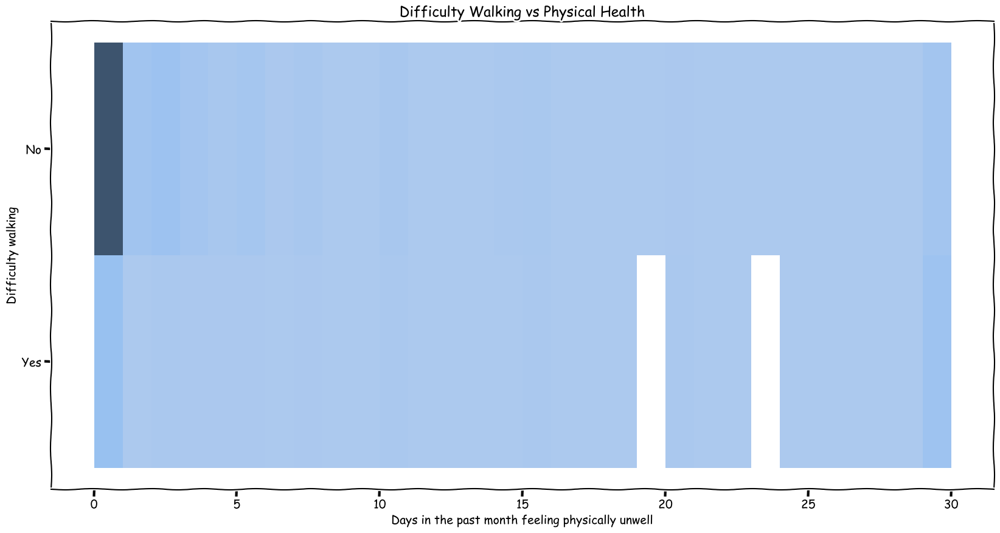

In [15]:
with plt.xkcd():
    plt.figure(figsize=(20, 10))
    sns.histplot(data=main_df, x="PhysicalHealth", y="DiffWalking", bins=30, common_norm=True, pthresh=0.0001, stat="density")
    plt.title("Difficulty Walking vs Physical Health")
    plt.xlabel("Days in the past month feeling physically unwell")
    plt.ylabel("Difficulty walking")
    plt.show()

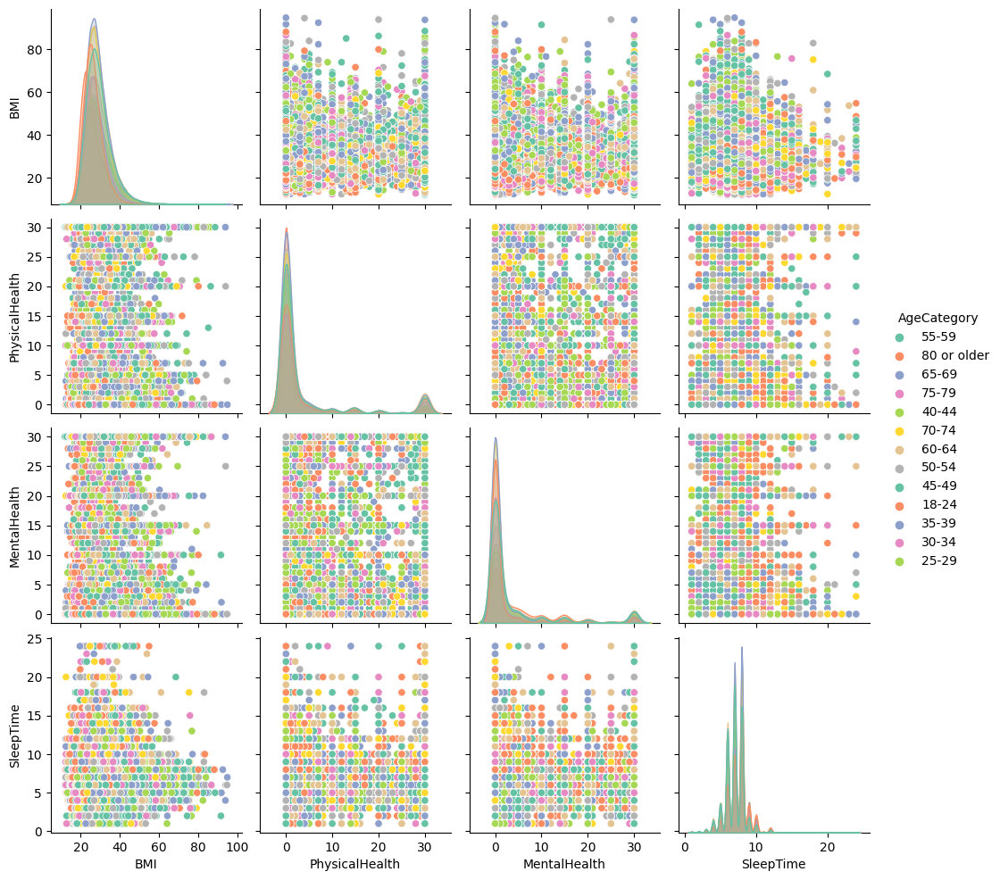

In [16]:
sns.pairplot(df, kind="scatter", hue="AgeCategory", palette="Set2")
plt.show()

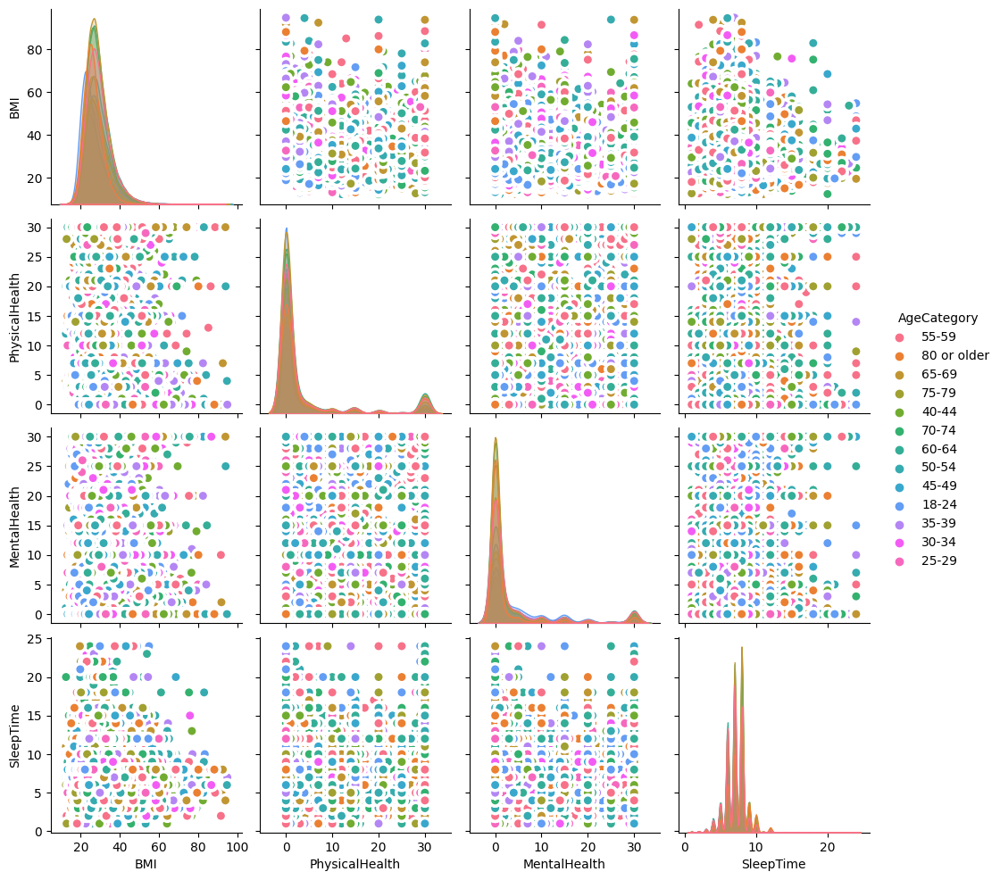

In [17]:
sns.pairplot(df, kind="scatter", hue="AgeCategory", plot_kws=dict(s=80, edgecolor="white", linewidth=2.5))
plt.show()

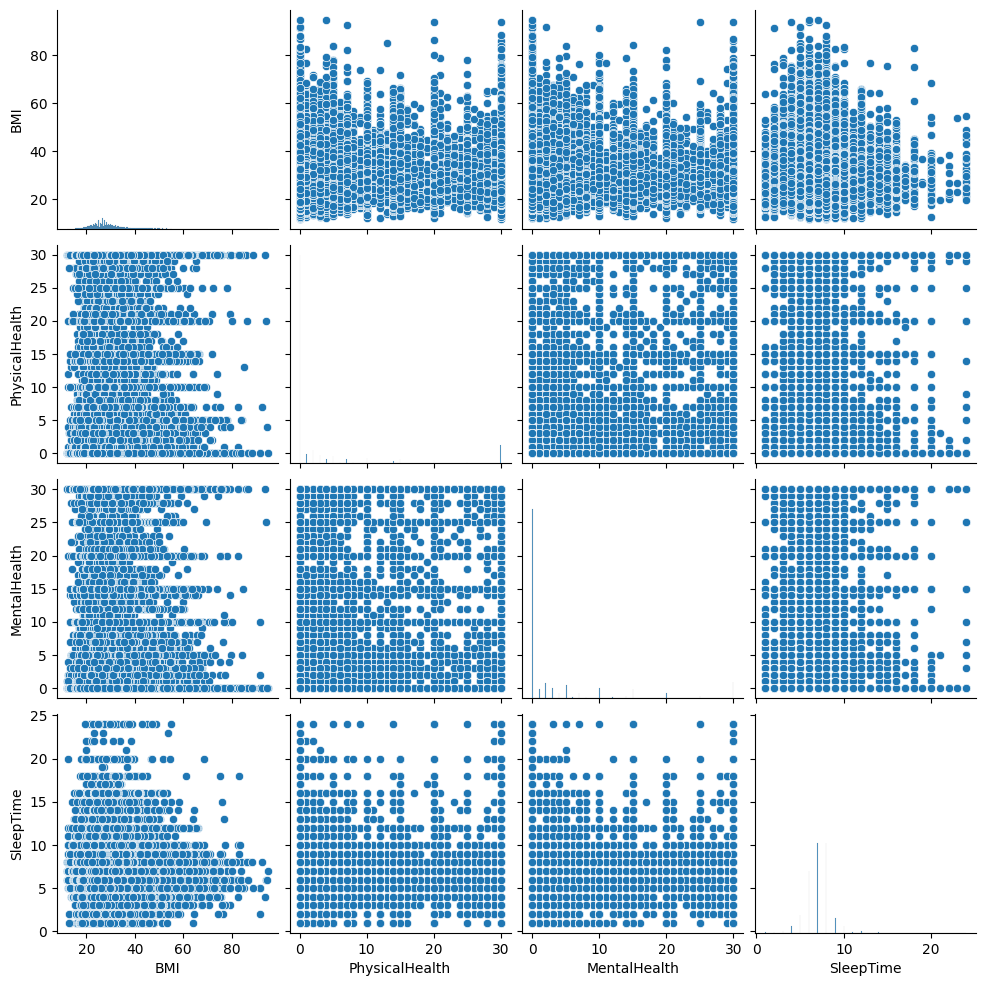

In [18]:
sns.pairplot(df)
plt.show()

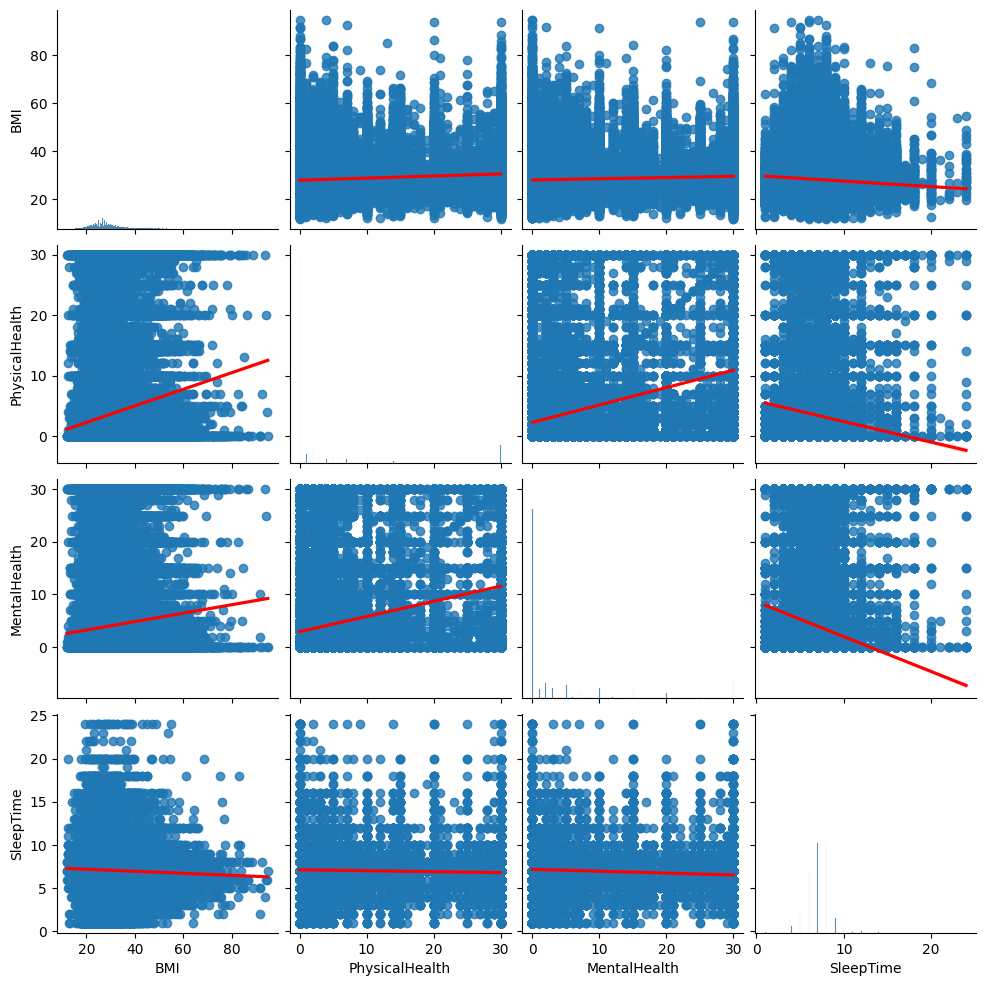

In [19]:
sns.pairplot(df, kind="reg", palette="Set2", plot_kws={'line_kws':{'color':'red'}})
plt.show()

---

<h1> Ranking: Bar Chart </h1>
<p> What do we want to rank by? We can rank by any numerical value, so that gives us BMI, Physical or Mental Health, and Sleep Time.</p>
<p> Let's start with BMI. This will be our Y axis (height). </p>
<p> What should our different sets of bars be? Let's try the response to each disease first. </p>
<p> Sets: Diseases (Heart Disease, Kidney Disease, Diabetic, Skin Cancer) </p>
<p> Bars: Values for diseases (Yes, No) </p>
<p> So we'll want a dataframe that contains BMI and diseases. </p>

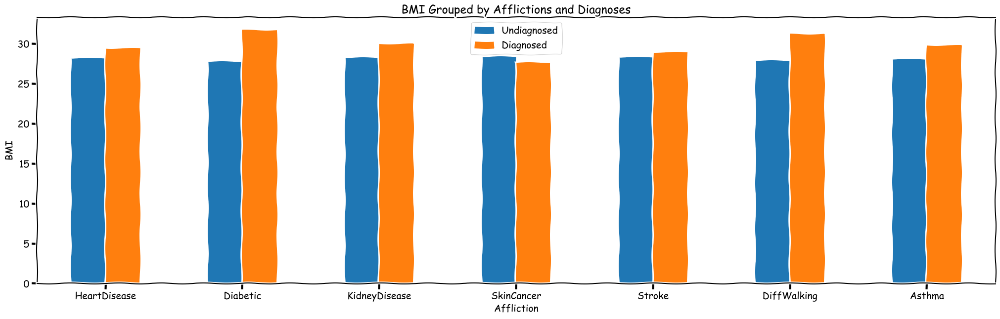

In [20]:
columns = ["BMI", "HeartDisease", "Diabetic", "KidneyDisease", "SkinCancer", "Stroke", "DiffWalking", "Asthma"]
heart = main_df[columns].groupby(["HeartDisease"]).BMI.mean()
diabetes = main_df[columns].groupby(["Diabetic"]).BMI.mean()
kidney = main_df[columns].groupby(["KidneyDisease"]).BMI.mean()
cancer = main_df[columns].groupby(["SkinCancer"]).BMI.mean()
stroke = main_df[columns].groupby(["Stroke"]).BMI.mean()
walking = main_df[columns].groupby(["DiffWalking"]).BMI.mean()
asthma = main_df[columns].groupby(["Asthma"]).BMI.mean()
no_bars = [heart.No, diabetes.No, kidney.No, cancer.No, stroke.No, walking.No, asthma.No]
yes_bars = [heart.Yes, diabetes.Yes, kidney.Yes, cancer.Yes, stroke.Yes, walking.Yes, asthma.Yes]
labels = tuple(columns[1:])
with plt.xkcd():
    df = pd.DataFrame({'Undiagnosed':no_bars,
                        'Diagnosed':yes_bars}, index=labels)
    df.plot.bar(figsize=(25, 7), rot=0)
    plt.title("BMI Grouped by Afflictions and Diagnoses")
    plt.xlabel("Affliction")
    plt.ylabel("BMI")
    plt.show()

<p>Let's examine BMI over polar non-disease categories. </p>

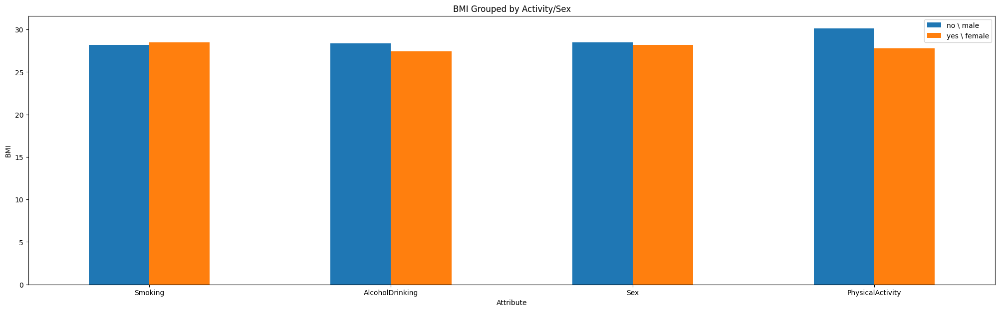

In [21]:
columns = ["BMI", "Smoking", "AlcoholDrinking", "Sex", "PhysicalActivity"]
smoke = main_df[columns].groupby(["Smoking"]).BMI.mean()
drank = main_df[columns].groupby(["AlcoholDrinking"]).BMI.mean()
sex = main_df[columns].groupby(["Sex"]).BMI.mean()
pa = main_df[columns].groupby(["PhysicalActivity"]).BMI.mean()
no_bars = [smoke.No, drank.No, sex.Male, pa.No]
yes_bars = [smoke.Yes, drank.Yes, sex.Female, pa.Yes]
labels = tuple(columns[1:])
df = pd.DataFrame({'no \ male':no_bars,
                    'yes \ female':yes_bars}, index=labels)
df.plot.bar(figsize=(25, 7), rot=0)
plt.title("BMI Grouped by Activity/Sex")
plt.xlabel("Attribute")
plt.ylabel("BMI")
plt.show()

<p> Let's go ahead and look at the rest of the variables and compare them to BMI. </p>

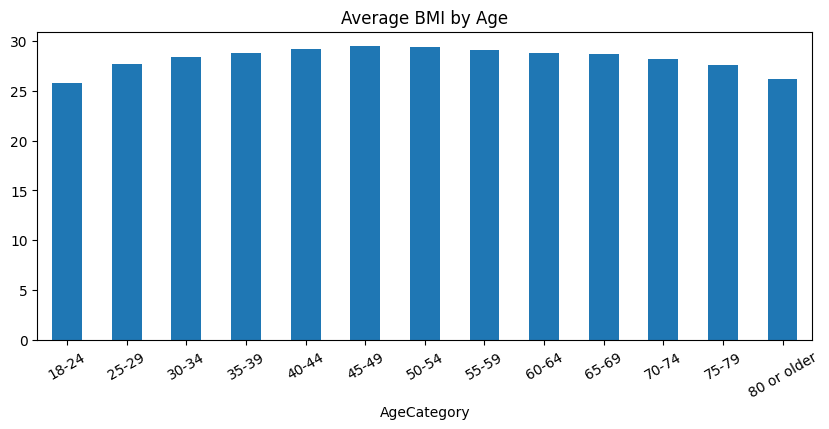

In [22]:
columns = ["BMI", "AgeCategory"]
age = main_df[columns].groupby(["AgeCategory"]).BMI.mean()
age.plot.bar(figsize=(10, 4), rot=30)
plt.title("Average BMI by Age")
plt.show()

<p> We can order this by BMI to see the rankings better and we can turn it into a circular bar chart for more visual attractiveness. </p>
<p> That being said, the circular bar charts don't have quantities, so these charts are mainly for comparison. </p>

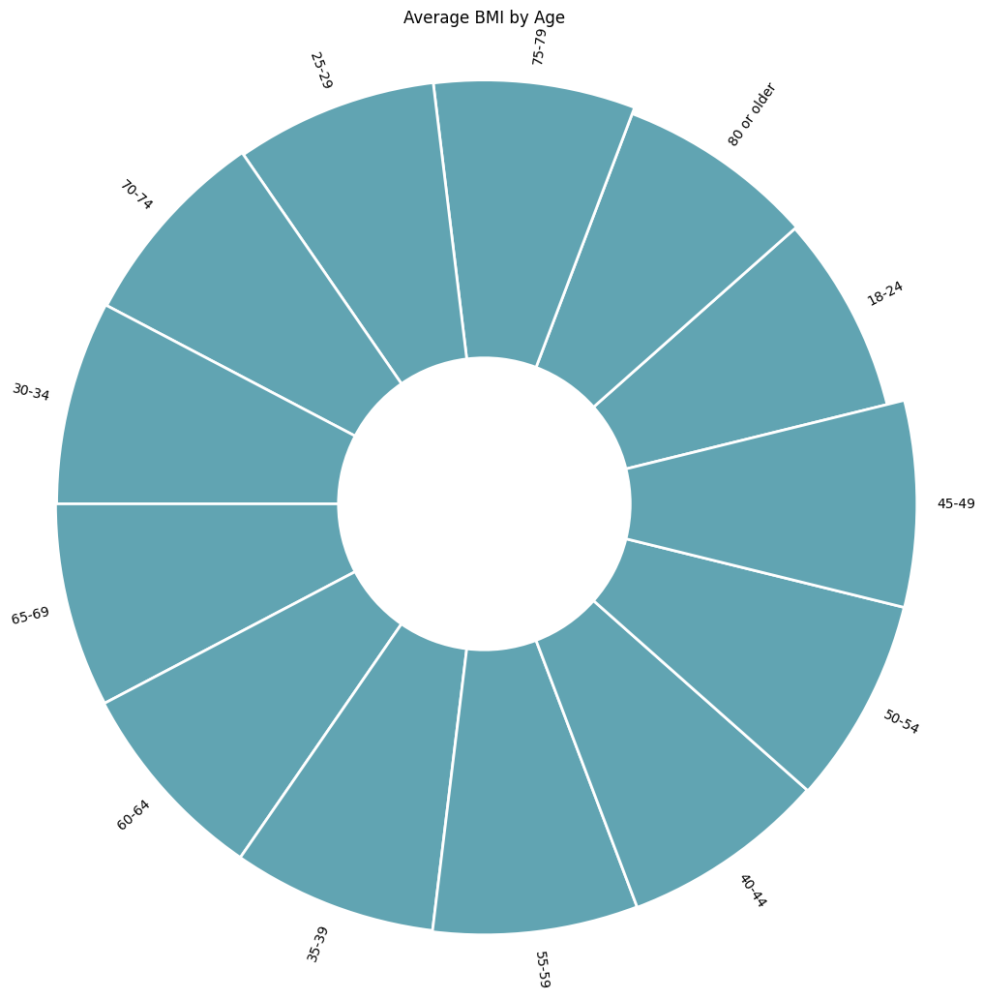

In [23]:
age = age.reset_index().sort_values(by=["BMI"])
age

plt.figure(figsize=(20, 12))
ax = plt.subplot(111, polar=True)
plt.axis('off')
upperLimit = 40
lowerLimit = 15

labelPadding = 2

max = age['BMI'].max()
slope = (max - lowerLimit) / max
heights = slope * age.BMI + lowerLimit 
width = 2*np.pi / len(age.index)
indexes = list(range(1, len(age.index)+1))
angles = [element * width for element in indexes]
angles
bars = ax.bar(
    x=angles,
    height=heights,
    width=width,
    bottom=lowerLimit,
    linewidth=2,
    edgecolor="white",
    color='#61a4b2'
)

for bar, angle, height, label in zip(bars, angles, heights, age["AgeCategory"]):
    rotation = np.rad2deg(angle)
    alignment = ""
    if angle >= np.pi/2 and angle < 3*np.pi/2:
        alignment = "right"
        rotation = rotation + 180
    else:
        alignment = "left"

    ax.text(
        x=angle,
        y=lowerLimit + bar.get_height() + labelPadding,
        s=label,
        ha=alignment,
        va='center',
        rotation=rotation,
        rotation_mode="anchor"
    )

plt.title("Average BMI by Age")
plt.show()

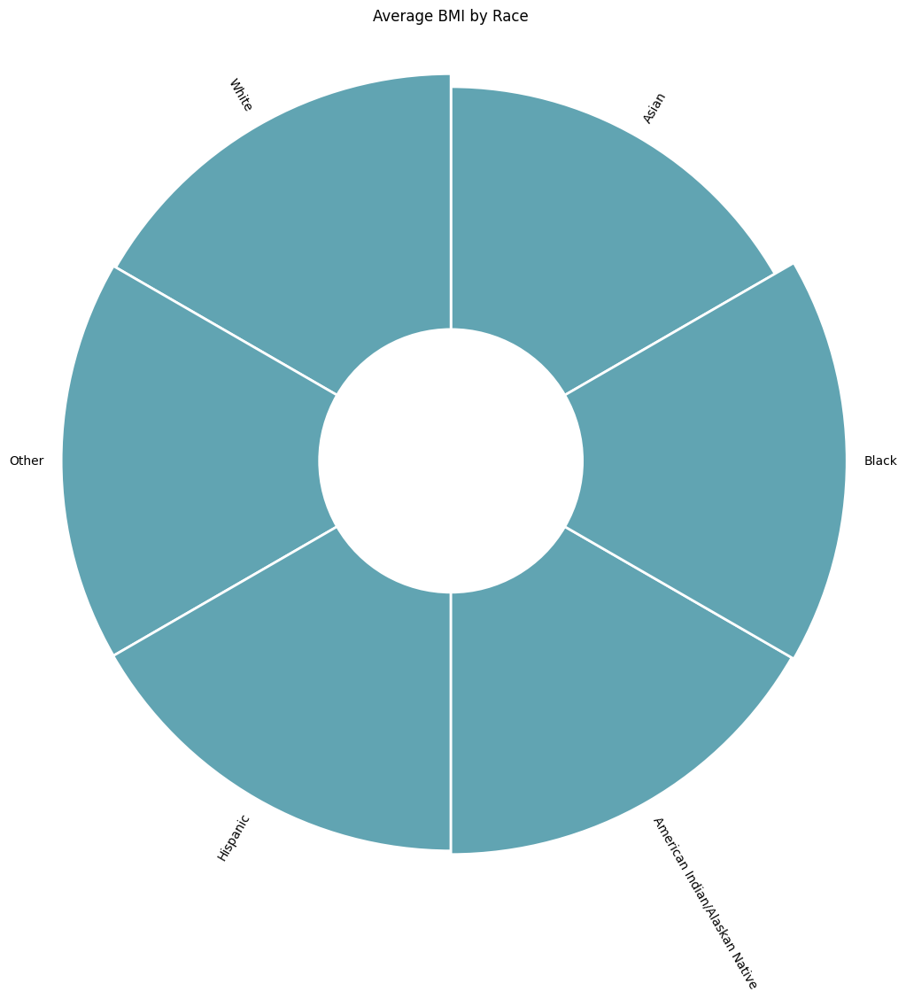

In [24]:
columns = ["BMI", "Race"]
race = main_df[columns].groupby(["Race"]).BMI.mean().reset_index().sort_values(by=["BMI"])

plt.figure(figsize=(20, 12))
ax = plt.subplot(111, polar=True)
plt.axis('off')
upperLimit = 40
lowerLimit = 15

labelPadding = 2

max = race['BMI'].max()
slope = (max - lowerLimit) / max
heights = slope * race.BMI + lowerLimit 
width = 2*np.pi / len(race.index)
indexes = list(range(1, len(race.index)+1))
angles = [element * width for element in indexes]
angles
bars = ax.bar(
    x=angles,
    height=heights,
    width=width,
    bottom=lowerLimit,
    linewidth=2,
    edgecolor="white",
    color='#61a4b2'
)

for bar, angle, height, label in zip(bars, angles, heights, race["Race"]):
    rotation = np.rad2deg(angle)
    alignment = ""
    if angle >= np.pi/2 and angle < 3*np.pi/2:
        alignment = "right"
        rotation = rotation + 180
    else:
        alignment = "left"

    ax.text(
        x=angle,
        y=lowerLimit + bar.get_height() + labelPadding,
        s=label,
        ha=alignment,
        va='center',
        rotation=rotation,
        rotation_mode="anchor"
    )

plt.title("Average BMI by Race")
plt.show()

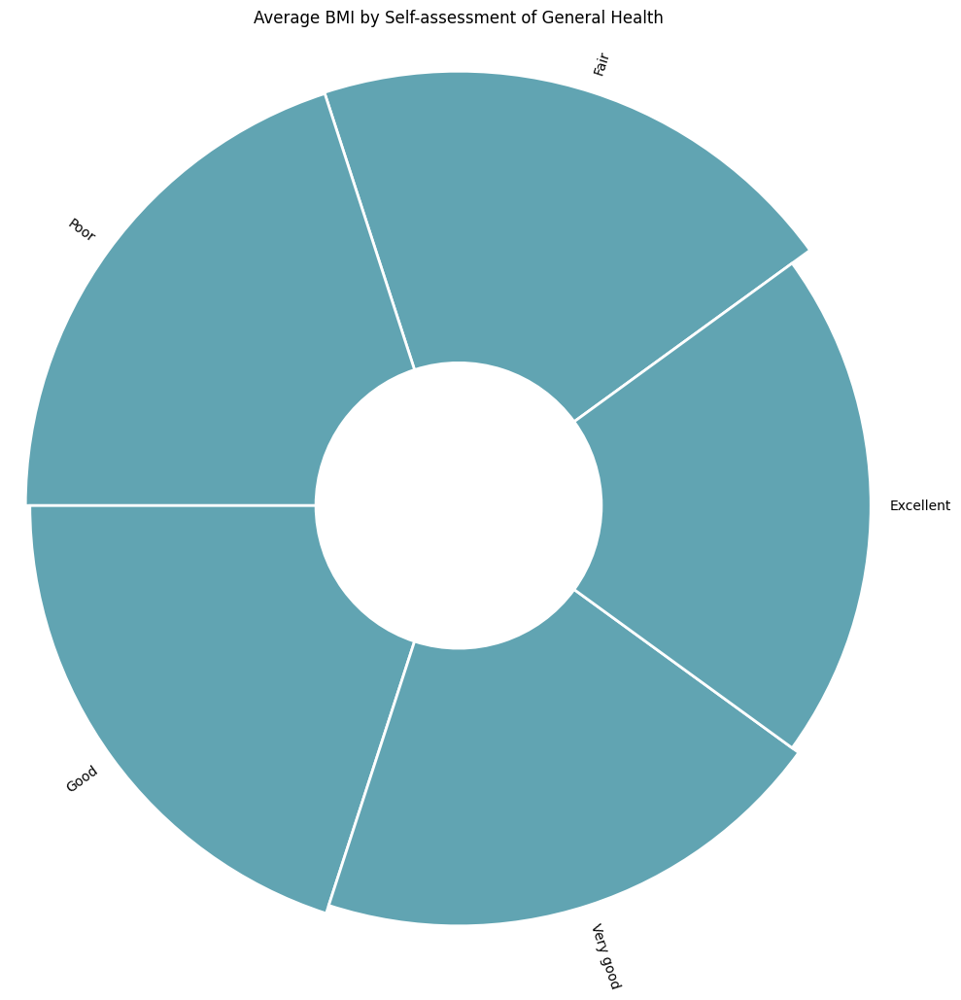

In [25]:
columns = ["BMI", "GenHealth"]
gen_health = main_df[columns].groupby(["GenHealth"]).BMI.mean().sort_values(ascending=False).reset_index()

plt.figure(figsize=(20, 12))
ax = plt.subplot(111, polar=True)
plt.axis('off')
upperLimit = 40
lowerLimit = 15

labelPadding = 2

max = gen_health['BMI'].max()
slope = (max - lowerLimit) / max
heights = slope * gen_health.BMI + lowerLimit 
width = 2*np.pi / len(gen_health.index)
indexes = list(range(1, len(gen_health.index)+1))
angles = [element * width for element in indexes]
angles
bars = ax.bar(
    x=angles,
    height=heights,
    width=width,
    bottom=lowerLimit,
    linewidth=2,
    edgecolor="white",
    color='#61a4b2'
)

for bar, angle, height, label in zip(bars, angles, heights, gen_health["GenHealth"]):
    rotation = np.rad2deg(angle)
    alignment = ""
    if angle >= np.pi/2 and angle < 3*np.pi/2:
        alignment = "right"
        rotation = rotation + 180
    else:
        alignment = "left"

    ax.text(
        x=angle,
        y=lowerLimit + bar.get_height() + labelPadding,
        s=label,
        ha=alignment,
        va='center',
        rotation=rotation,
        rotation_mode="anchor"
    )

plt.title("Average BMI by Self-assessment of General Health")
plt.show()


<h3> Great! Here were the top insights we got from ranking BMI against other features: </h3>
<p> - Diabetics and those who had difficulty walking tended to have higher on average BMI. </p>
<p> - Those who drank alcohol, those who exercised, and those who were on the more positive end of their general health response had a lower average BMI. </p>
<p> - Age extremes tend to have a lower BMI, which makes sense. </p>
<p> - Not much variance in BMI for age, race, and general health categories. The youngest patients, patients of asian descent, and those who felt they were in excellent general health all had the lowest average BMI in their respective categories. </p>

<h3> Now we'll do the same for the other 3 numerical values! </h3>

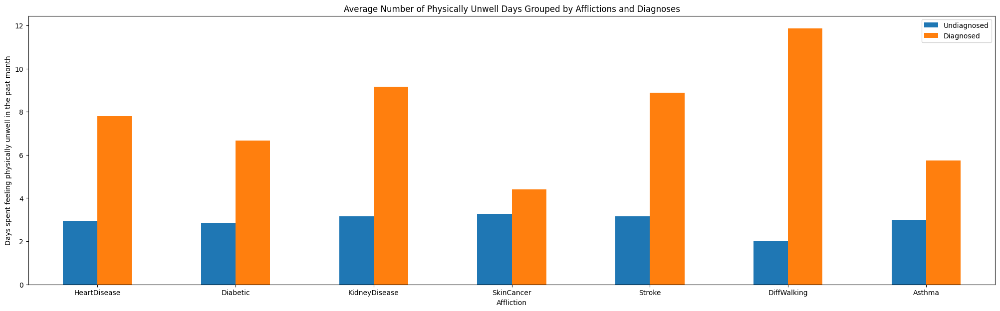

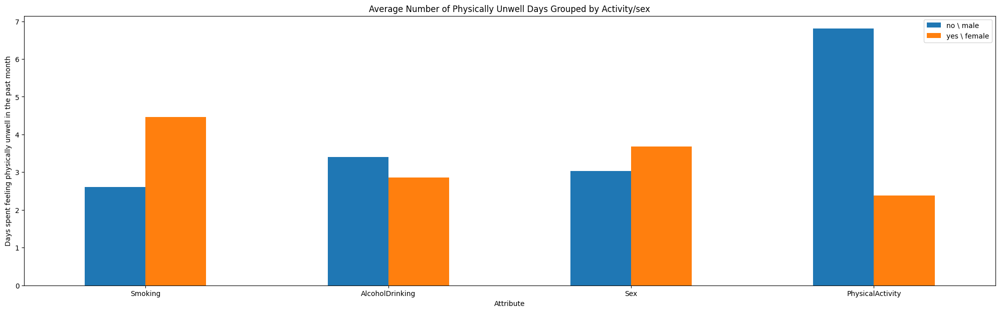

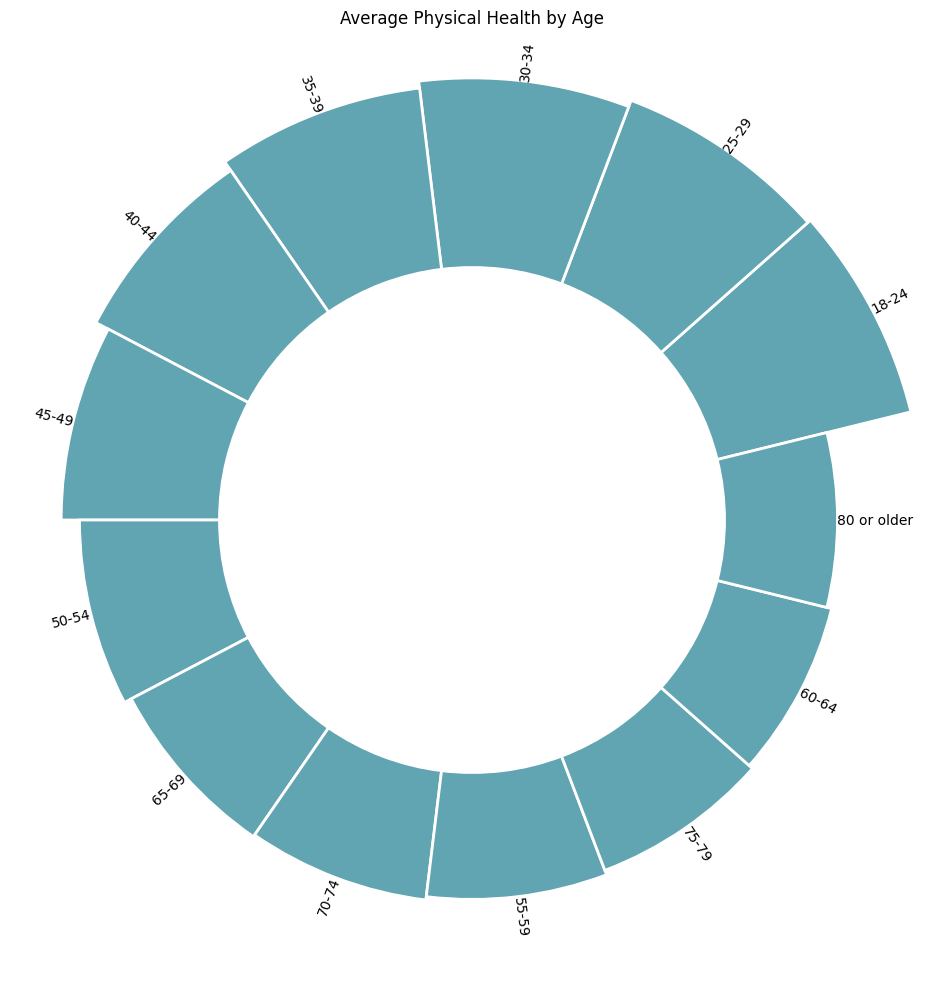

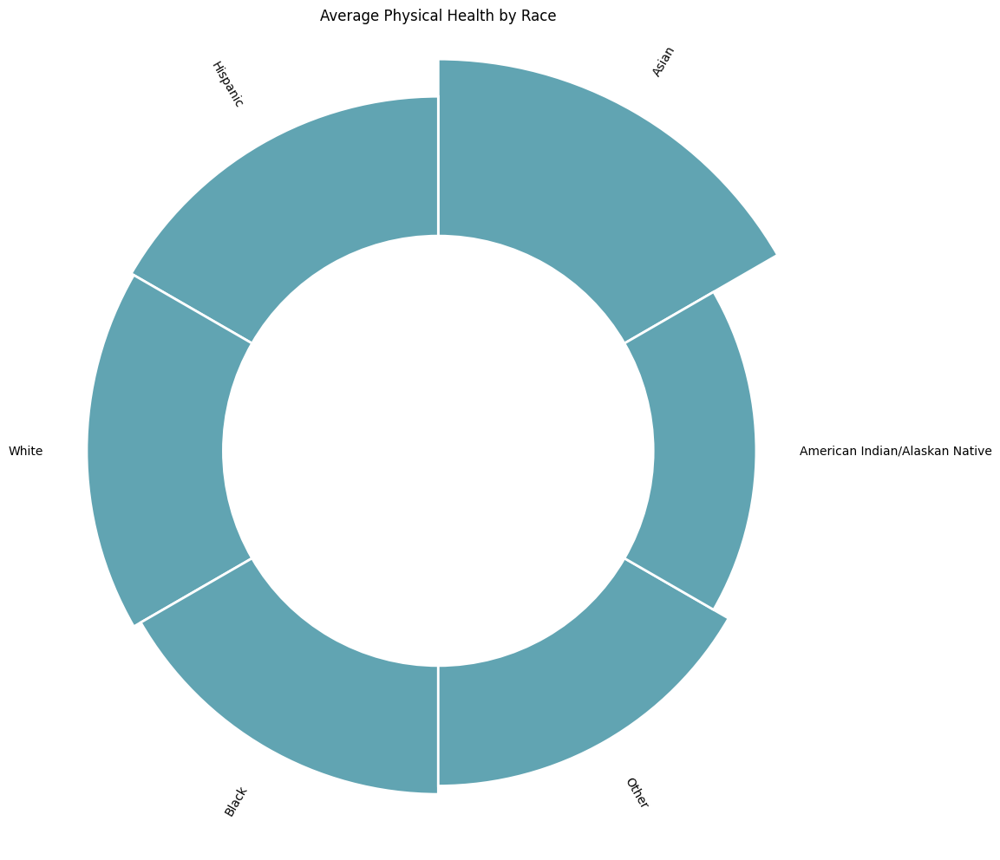

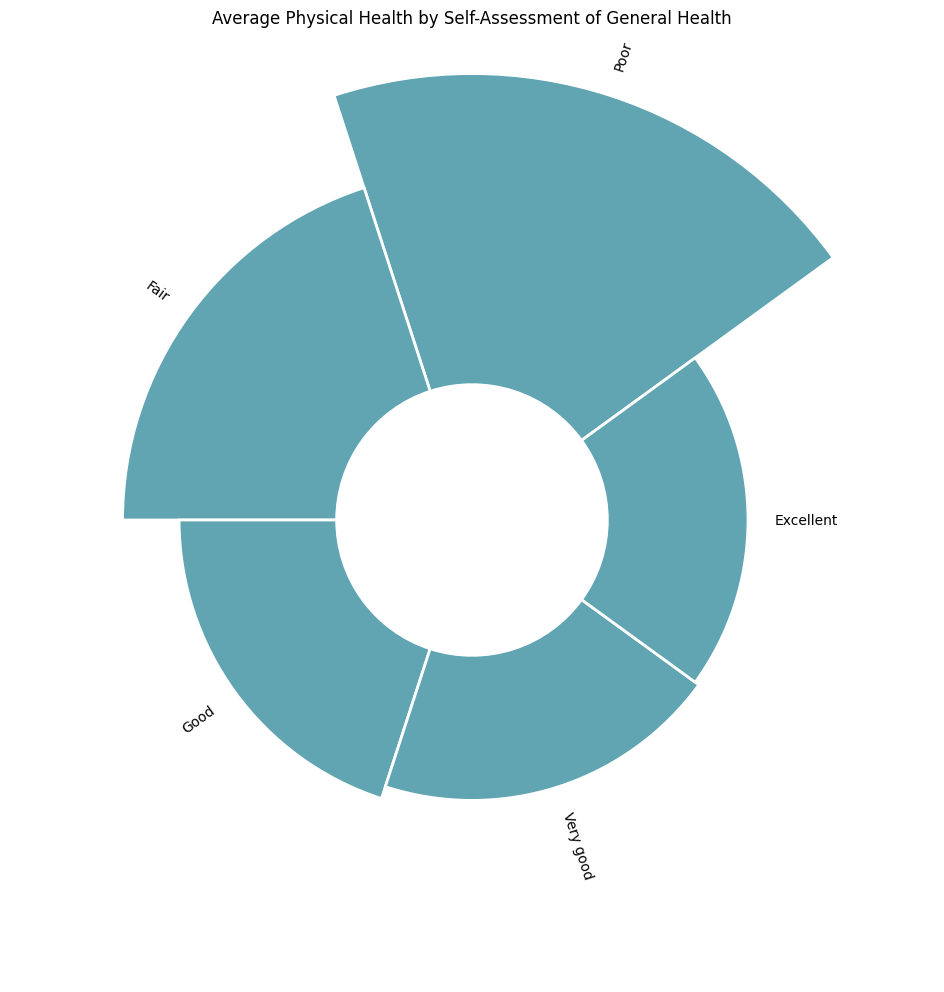

In [26]:
columns = ["PhysicalHealth", "HeartDisease", "Diabetic", "KidneyDisease", "SkinCancer", "Stroke", "DiffWalking", "Asthma"]
heart = main_df[columns].groupby(["HeartDisease"]).PhysicalHealth.mean()
diabetes = main_df[columns].groupby(["Diabetic"]).PhysicalHealth.mean()
kidney = main_df[columns].groupby(["KidneyDisease"]).PhysicalHealth.mean()
cancer = main_df[columns].groupby(["SkinCancer"]).PhysicalHealth.mean()
stroke = main_df[columns].groupby(["Stroke"]).PhysicalHealth.mean()
walking = main_df[columns].groupby(["DiffWalking"]).PhysicalHealth.mean()
asthma = main_df[columns].groupby(["Asthma"]).PhysicalHealth.mean()
no_bars = [heart.No, diabetes.No, kidney.No, cancer.No, stroke.No, walking.No, asthma.No]
yes_bars = [heart.Yes, diabetes.Yes, kidney.Yes, cancer.Yes, stroke.Yes, walking.Yes, asthma.Yes]
labels = tuple(columns[1:])
df = pd.DataFrame({'Undiagnosed':no_bars,
                    'Diagnosed':yes_bars}, index=labels)
df.plot.bar(figsize=(25, 7), rot=0)
plt.title("Average Number of Physically Unwell Days Grouped by Afflictions and Diagnoses")
plt.xlabel("Affliction")
plt.ylabel("Days spent feeling physically unwell in the past month")
plt.show()

columns = ["PhysicalHealth", "Smoking", "AlcoholDrinking", "Sex", "PhysicalActivity"]
smoke = main_df[columns].groupby(["Smoking"]).PhysicalHealth.mean()
drank = main_df[columns].groupby(["AlcoholDrinking"]).PhysicalHealth.mean()
sex = main_df[columns].groupby(["Sex"]).PhysicalHealth.mean()
pa = main_df[columns].groupby(["PhysicalActivity"]).PhysicalHealth.mean()
no_bars = [smoke.No, drank.No, sex.Male, pa.No]
yes_bars = [smoke.Yes, drank.Yes, sex.Female, pa.Yes]
labels = tuple(columns[1:])
df = pd.DataFrame({'no \ male':no_bars,
                    'yes \ female':yes_bars}, index=labels)
df.plot.bar(figsize=(25, 7), rot=0)
plt.title("Average Number of Physically Unwell Days Grouped by Activity/sex")
plt.xlabel("Attribute")
plt.ylabel("Days spent feeling physically unwell in the past month")
plt.show()

columns = ["PhysicalHealth", "AgeCategory"]
age = main_df[columns].groupby(["AgeCategory"]).PhysicalHealth.mean().reset_index().sort_values(by=["PhysicalHealth"])
plt.figure(figsize=(20, 12))
ax = plt.subplot(111, polar=True)
plt.axis('off')
upperLimit = 30
lowerLimit = 10

labelPadding = 0

max = age['PhysicalHealth'].max()
slope = (max - lowerLimit) / max
heights = slope * age.PhysicalHealth + lowerLimit 
width = 2*np.pi / len(age.index)
indexes = list(range(1, len(age.index)+1))
angles = [element * width for element in indexes]
angles
bars = ax.bar(
    x=angles,
    height=heights,
    width=width,
    bottom=lowerLimit,
    linewidth=2,
    edgecolor="white",
    color='#61a4b2'
)

for bar, angle, height, label in zip(bars, angles, heights, age["AgeCategory"]):
    rotation = np.rad2deg(angle)
    alignment = ""
    if angle >= np.pi/2 and angle < 3*np.pi/2:
        alignment = "right"
        rotation = rotation + 180
    else:
        alignment = "left"

    ax.text(
        x=angle,
        y=lowerLimit + bar.get_height() + labelPadding,
        s=label,
        ha=alignment,
        va='center',
        rotation=rotation,
        rotation_mode="anchor"
    )

plt.title("Average Physical Health by Age")
plt.show()

columns = ["PhysicalHealth", "Race"]
race = main_df[columns].groupby(["Race"]).PhysicalHealth.mean().reset_index().sort_values(by=["PhysicalHealth"])
plt.figure(figsize=(20, 12))
ax = plt.subplot(111, polar=True)
plt.axis('off')
upperLimit = 30
lowerLimit = 10

labelPadding = 2

max = race['PhysicalHealth'].max()
slope = (max - lowerLimit) / max
heights = slope * race.PhysicalHealth + lowerLimit 
width = 2*np.pi / len(race.index)
indexes = list(range(1, len(race.index)+1))
angles = [element * width for element in indexes]
angles
bars = ax.bar(
    x=angles,
    height=heights,
    width=width,
    bottom=lowerLimit,
    linewidth=2,
    edgecolor="white",
    color='#61a4b2'
)

for bar, angle, height, label in zip(bars, angles, heights, race["Race"]):
    rotation = np.rad2deg(angle)
    alignment = ""
    if angle >= np.pi/2 and angle < 3*np.pi/2:
        alignment = "right"
        rotation = rotation + 180
    else:
        alignment = "left"

    ax.text(
        x=angle,
        y=lowerLimit + bar.get_height() + labelPadding,
        s=label,
        ha=alignment,
        va='center',
        rotation=rotation,
        rotation_mode="anchor"
    )

plt.title("Average Physical Health by Race")
plt.show()

columns = ["PhysicalHealth", "GenHealth"]
gen_health = main_df[columns].groupby(["GenHealth"]).PhysicalHealth.mean().sort_values(ascending=False).reset_index()


plt.figure(figsize=(20, 12))
ax = plt.subplot(111, polar=True)
plt.axis('off')
upperLimit = 30
lowerLimit = 10

labelPadding = 2

max = gen_health['PhysicalHealth'].max()
slope = (max - lowerLimit) / max
heights = slope * gen_health.PhysicalHealth + lowerLimit 
width = 2*np.pi / len(gen_health.index)
indexes = list(range(1, len(gen_health.index)+1))
angles = [element * width for element in indexes]
angles
bars = ax.bar(
    x=angles,
    height=heights,
    width=width,
    bottom=lowerLimit,
    linewidth=2,
    edgecolor="white",
    color='#61a4b2'
)

for bar, angle, height, label in zip(bars, angles, heights, gen_health["GenHealth"]):
    rotation = np.rad2deg(angle)
    alignment = ""
    if angle >= np.pi/2 and angle < 3*np.pi/2:
        alignment = "right"
        rotation = rotation + 180
    else:
        alignment = "left"

    ax.text(
        x=angle,
        y=lowerLimit + bar.get_height() + labelPadding,
        s=label,
        ha=alignment,
        va='center',
        rotation=rotation,
        rotation_mode="anchor"
    )

plt.title("Average Physical Health by Self-Assessment of General Health")
plt.show()

<p> For days in the past month feeling physically unwell: </p>
<p> - Patients who had difficulty walking, had a stroke in the past, or had kidney disease all had higher changes to average physical sick days than patients with heart disease. </p>
<p> - Patients who did not exercise had more physical sick days. </p>
<p> - Age and race have similar averages for physical health. As expected, those who felt they were in poor general health tended to have a much higher number of sick days on average. </p>

<h3> Next: Days in the past month spent feeling mentally unwell </h3>

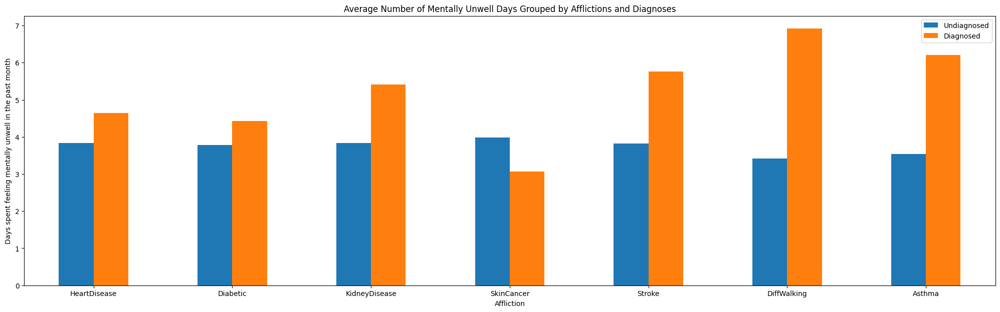

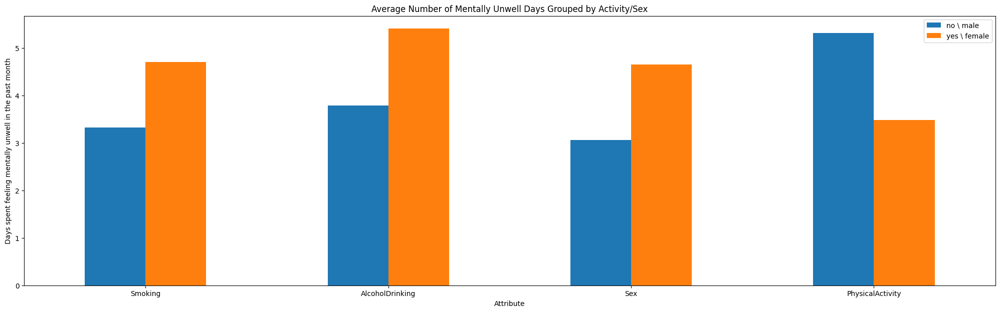

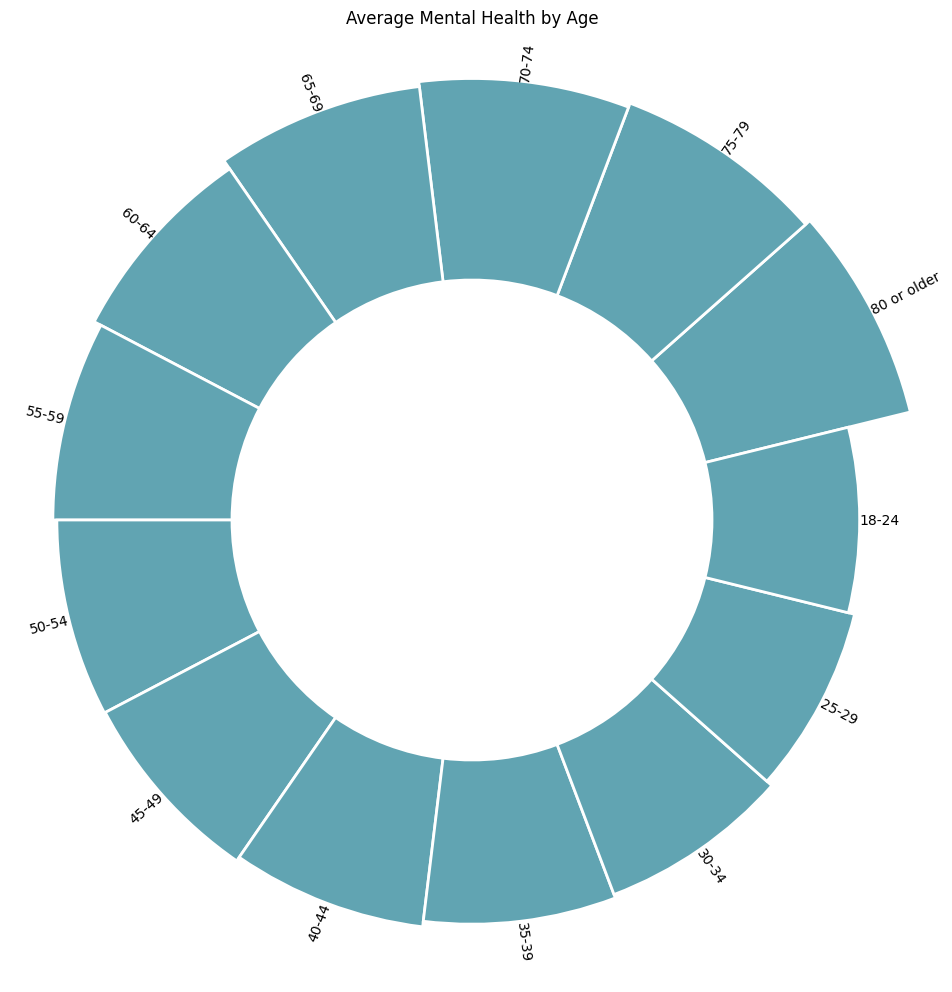

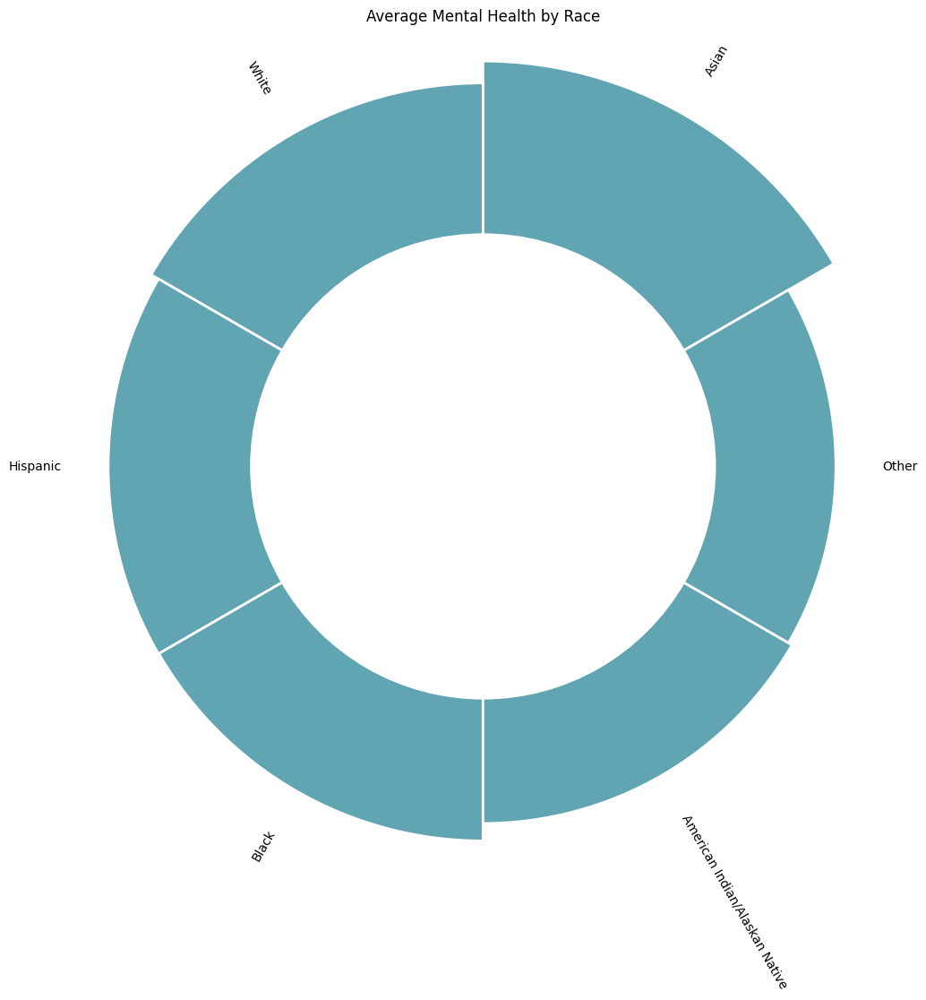

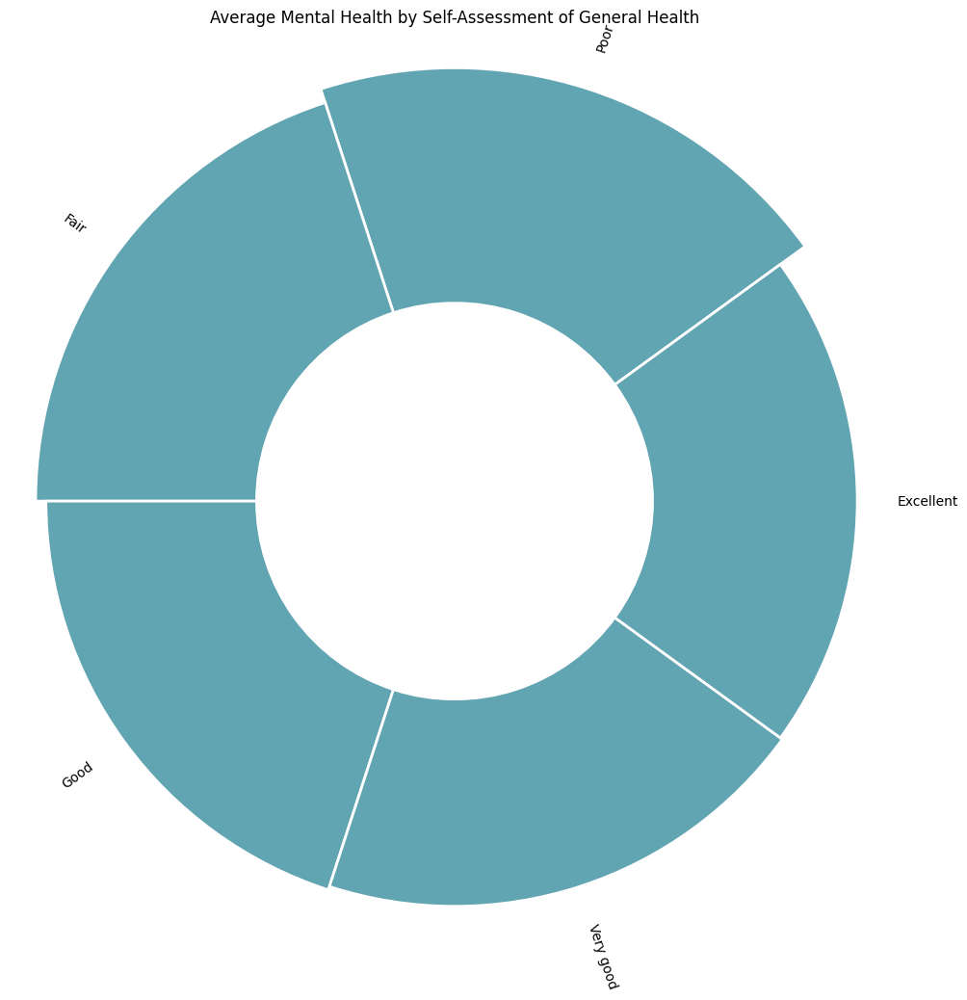

In [27]:
columns = ["MentalHealth", "HeartDisease", "Diabetic", "KidneyDisease", "SkinCancer", "Stroke", "DiffWalking", "Asthma"]
heart = main_df[columns].groupby(["HeartDisease"]).MentalHealth.mean()
diabetes = main_df[columns].groupby(["Diabetic"]).MentalHealth.mean()
kidney = main_df[columns].groupby(["KidneyDisease"]).MentalHealth.mean()
cancer = main_df[columns].groupby(["SkinCancer"]).MentalHealth.mean()
stroke = main_df[columns].groupby(["Stroke"]).MentalHealth.mean()
walking = main_df[columns].groupby(["DiffWalking"]).MentalHealth.mean()
asthma = main_df[columns].groupby(["Asthma"]).MentalHealth.mean()
no_bars = [heart.No, diabetes.No, kidney.No, cancer.No, stroke.No, walking.No, asthma.No]
yes_bars = [heart.Yes, diabetes.Yes, kidney.Yes, cancer.Yes, stroke.Yes, walking.Yes, asthma.Yes]
labels = tuple(columns[1:])
df = pd.DataFrame({'Undiagnosed':no_bars,
                    'Diagnosed':yes_bars}, index=labels)
df.plot.bar(figsize=(25, 7), rot=0)
plt.title("Average Number of Mentally Unwell Days Grouped by Afflictions and Diagnoses")
plt.xlabel("Affliction")
plt.ylabel("Days spent feeling mentally unwell in the past month")
plt.show()

columns = ["MentalHealth", "Smoking", "AlcoholDrinking", "Sex", "PhysicalActivity"]
smoke = main_df[columns].groupby(["Smoking"]).MentalHealth.mean()
drank = main_df[columns].groupby(["AlcoholDrinking"]).MentalHealth.mean()
sex = main_df[columns].groupby(["Sex"]).MentalHealth.mean()
pa = main_df[columns].groupby(["PhysicalActivity"]).MentalHealth.mean()
no_bars = [smoke.No, drank.No, sex.Male, pa.No]
yes_bars = [smoke.Yes, drank.Yes, sex.Female, pa.Yes]
labels = tuple(columns[1:])
df = pd.DataFrame({'no \ male':no_bars,
                    'yes \ female':yes_bars}, index=labels)
df.plot.bar(figsize=(25, 7), rot=0)
plt.title("Average Number of Mentally Unwell Days Grouped by Activity/Sex")
plt.xlabel("Attribute")
plt.ylabel("Days spent feeling mentally unwell in the past month")
plt.show()

columns = ["MentalHealth", "AgeCategory"]
age = main_df[columns].groupby(["AgeCategory"]).MentalHealth.mean().reset_index().sort_values(by=["MentalHealth"])
plt.figure(figsize=(20, 12))
ax = plt.subplot(111, polar=True)
plt.axis('off')
upperLimit = 30
lowerLimit = 10

labelPadding = 0

max = age['MentalHealth'].max()
slope = (max - lowerLimit) / max
heights = slope * age.MentalHealth + lowerLimit 
width = 2*np.pi / len(age.index)
indexes = list(range(1, len(age.index)+1))
angles = [element * width for element in indexes]
angles
bars = ax.bar(
    x=angles,
    height=heights,
    width=width,
    bottom=lowerLimit,
    linewidth=2,
    edgecolor="white",
    color='#61a4b2'
)

for bar, angle, height, label in zip(bars, angles, heights, age["AgeCategory"]):
    rotation = np.rad2deg(angle)
    alignment = ""
    if angle >= np.pi/2 and angle < 3*np.pi/2:
        alignment = "right"
        rotation = rotation + 180
    else:
        alignment = "left"

    ax.text(
        x=angle,
        y=lowerLimit + bar.get_height() + labelPadding,
        s=label,
        ha=alignment,
        va='center',
        rotation=rotation,
        rotation_mode="anchor"
    )

plt.title("Average Mental Health by Age")
plt.show()

columns = ["MentalHealth", "Race"]
race = main_df[columns].groupby(["Race"]).MentalHealth.mean().reset_index().sort_values(by=["MentalHealth"])
plt.figure(figsize=(20, 12))
ax = plt.subplot(111, polar=True)
plt.axis('off')
upperLimit = 30
lowerLimit = 10

labelPadding = 2

max = race['MentalHealth'].max()
slope = (max - lowerLimit) / max
heights = slope * race.MentalHealth + lowerLimit 
width = 2*np.pi / len(race.index)
indexes = list(range(1, len(race.index)+1))
angles = [element * width for element in indexes]
angles
bars = ax.bar(
    x=angles,
    height=heights,
    width=width,
    bottom=lowerLimit,
    linewidth=2,
    edgecolor="white",
    color='#61a4b2'
)

for bar, angle, height, label in zip(bars, angles, heights, race["Race"]):
    rotation = np.rad2deg(angle)
    alignment = ""
    if angle >= np.pi/2 and angle < 3*np.pi/2:
        alignment = "right"
        rotation = rotation + 180
    else:
        alignment = "left"

    ax.text(
        x=angle,
        y=lowerLimit + bar.get_height() + labelPadding,
        s=label,
        ha=alignment,
        va='center',
        rotation=rotation,
        rotation_mode="anchor"
    )

plt.title("Average Mental Health by Race")
plt.show()

columns = ["MentalHealth", "GenHealth"]
gen_health = main_df[columns].groupby(["GenHealth"]).MentalHealth.mean().sort_values(ascending=False).reset_index()


plt.figure(figsize=(20, 12))
ax = plt.subplot(111, polar=True)
plt.axis('off')
upperLimit = 30
lowerLimit = 10

labelPadding = 2

max = gen_health['MentalHealth'].max()
slope = (max - lowerLimit) / max
heights = slope * gen_health.MentalHealth + lowerLimit 
width = 2*np.pi / len(gen_health.index)
indexes = list(range(1, len(gen_health.index)+1))
angles = [element * width for element in indexes]
angles
bars = ax.bar(
    x=angles,
    height=heights,
    width=width,
    bottom=lowerLimit,
    linewidth=2,
    edgecolor="white",
    color='#61a4b2'
)

for bar, angle, height, label in zip(bars, angles, heights, gen_health["GenHealth"]):
    rotation = np.rad2deg(angle)
    alignment = ""
    if angle >= np.pi/2 and angle < 3*np.pi/2:
        alignment = "right"
        rotation = rotation + 180
    else:
        alignment = "left"

    ax.text(
        x=angle,
        y=lowerLimit + bar.get_height() + labelPadding,
        s=label,
        ha=alignment,
        va='center',
        rotation=rotation,
        rotation_mode="anchor"
    )

plt.title("Average Mental Health by Self-Assessment of General Health")
plt.show()

<h3> Mental Wellbeing insights: </h3>
<p> - Patients who have had a stroke, difficulty walking, or asthma all note more days feeling mentally unwell than those with heart disease. </p>
<p> - There's a significant positive correlation between more mental sick days and all of the following: smokers, alcoholics, non-exercisers, and women. </p>
<p> - Age category correlation compared to physical sick days is flipped: More old people feel physically unwell, more young people feel mentally unwell. </p>
<p> - Those of asian descent report the most physical and mental sick days. Could this be bias? </p>

---

In [28]:
df = pd.read_csv('heart_2020_cleaned.csv')

In [29]:

df.corr()

,BMI,PhysicalHealth,MentalHealth,SleepTime
BMI,1.000000,0.109788,0.064131,-0.051822
PhysicalHealth,0.109788,1.000000,0.287987,-0.061387
MentalHealth,0.064131,0.287987,1.000000,-0.119717
SleepTime,-0.051822,-0.061387,-0.119717,1.000000


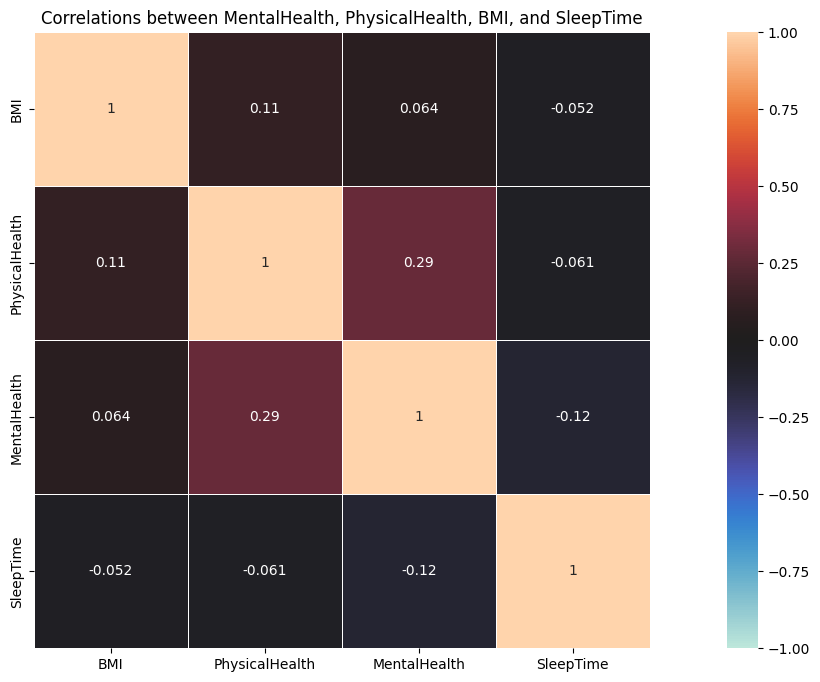

In [30]:
plt.figure(figsize=(20,8))
heat_map = sns.heatmap(df.corr(), vmax=1, vmin=-1, center=0,
			linewidth=.5,square=True, annot = True)
plt.title('Correlations between MentalHealth, PhysicalHealth, BMI, and SleepTime')
plt.show()

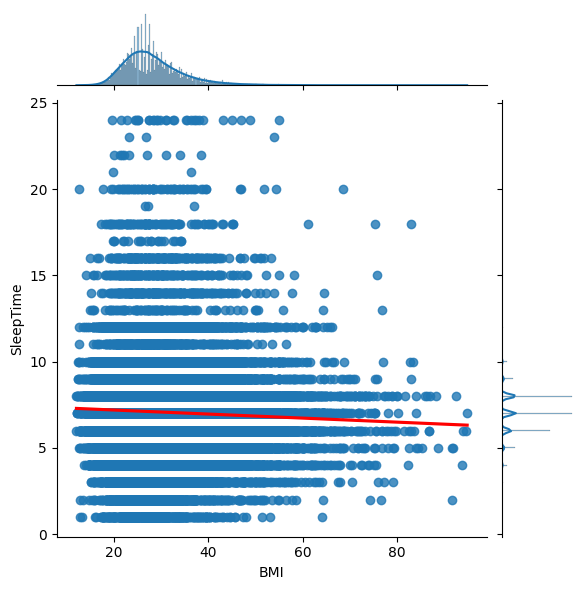

In [31]:
plot = sns.jointplot(x=df['BMI'], y=df['SleepTime'], data=df, kind='reg')
regline = plot.ax_joint.get_lines()[0]
regline.set_color('red')
regline.set_zorder(5)
plt.show()

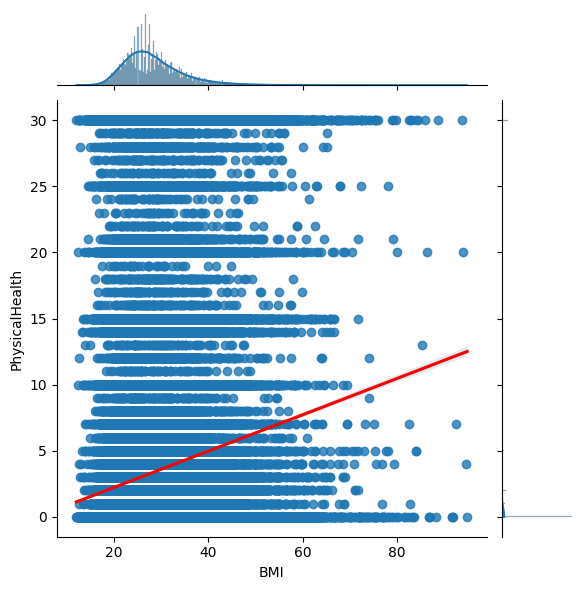

In [32]:
plot = sns.jointplot(x=df['BMI'], y=df['PhysicalHealth'], data=df, kind='reg')
regline = plot.ax_joint.get_lines()[0]
regline.set_color('red')
regline.set_zorder(5)
plt.show()
plt.show()

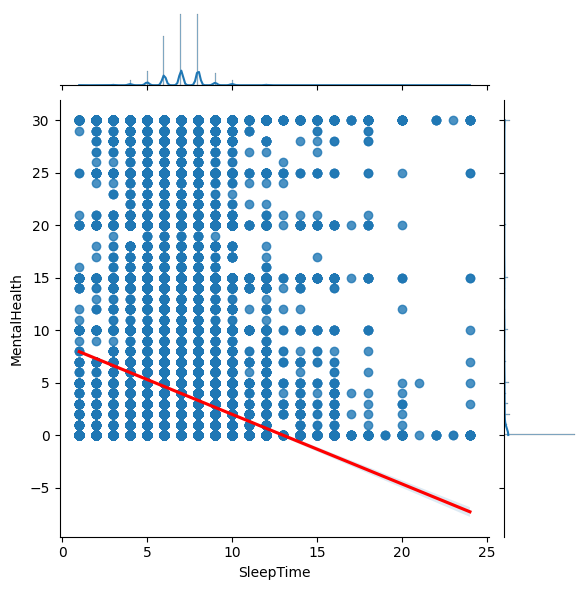

In [33]:
plot = sns.jointplot(x=df['SleepTime'], y=df['MentalHealth'], data=df, kind='reg')
regline = plot.ax_joint.get_lines()[0]
regline.set_color('red')
regline.set_zorder(5)
plt.show()
plt.show()

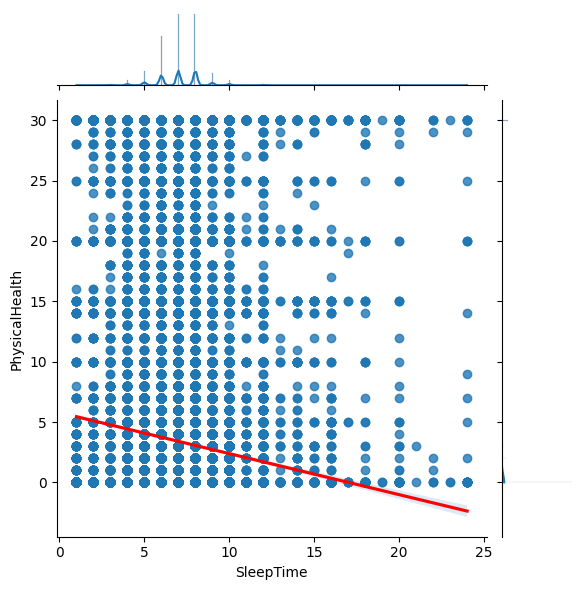

In [34]:
plot = sns.jointplot(x=df['SleepTime'], y=df['PhysicalHealth'], data=df, kind='reg')
regline = plot.ax_joint.get_lines()[0]
regline.set_color('red')
regline.set_zorder(5)
plt.show()
plt.show()

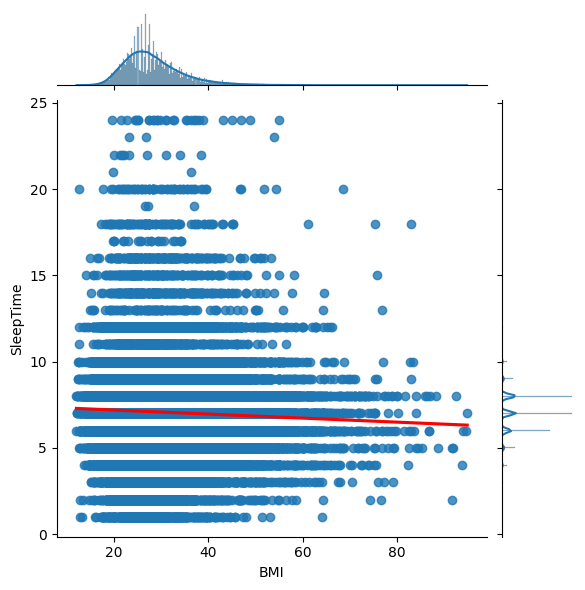

In [35]:
plot = sns.jointplot(x=df['BMI'], y=df['SleepTime'], data=df, kind='reg')
regline = plot.ax_joint.get_lines()[0]
regline.set_color('red')
regline.set_zorder(5)
plt.show()

In [36]:
sns.set(style="darkgrid")

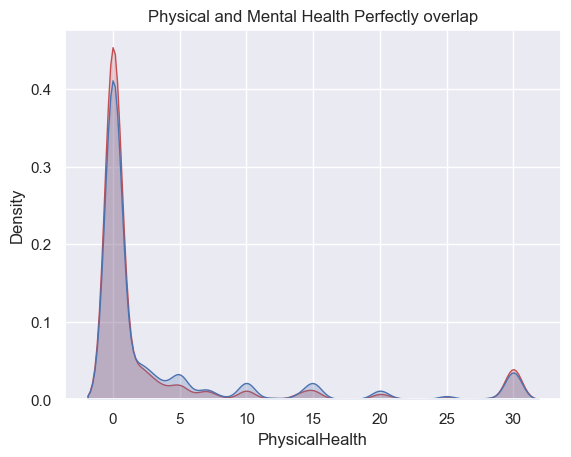

In [37]:
fig = sns.kdeplot(df['PhysicalHealth'], shade=True, color="r")
fig = sns.kdeplot(df['MentalHealth'], shade=True, color="b")
plt.title('Physical and Mental Health Perfectly overlap')
plt.show()

c:\Users\ducey\Desktop\JUMP\Week 5\week_5_env\lib\site-packages\seaborn\distributions.py:1699: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.5 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)


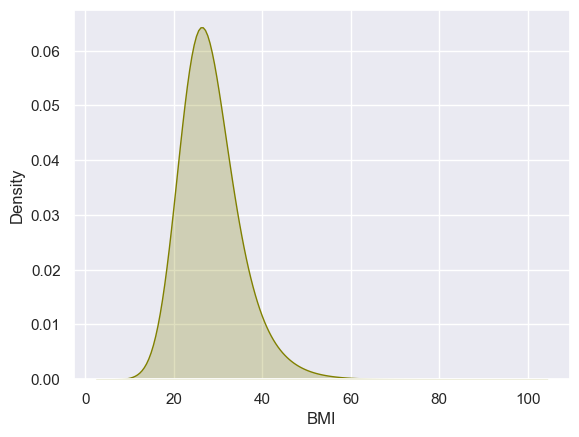

In [38]:
sns.kdeplot(df['BMI'], shade=True, bw=0.5, color="olive")
plt.show()

c:\Users\ducey\Desktop\JUMP\Week 5\week_5_env\lib\site-packages\seaborn\distributions.py:1699: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.5 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)


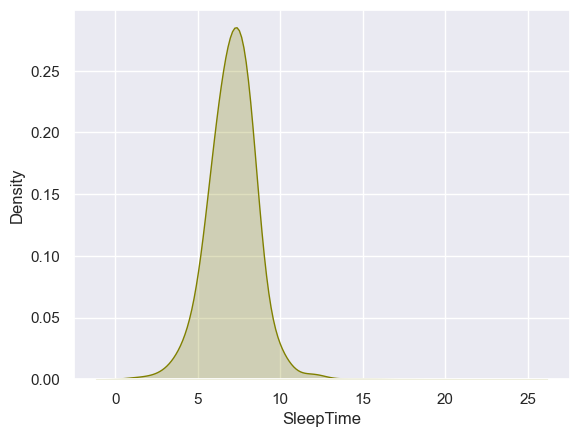

In [39]:
sns.kdeplot(df['SleepTime'], shade=True, bw=0.5, color="olive")
plt.show()

c:\Users\ducey\Desktop\JUMP\Week 5\week_5_env\lib\site-packages\seaborn\distributions.py:1699: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.5 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)


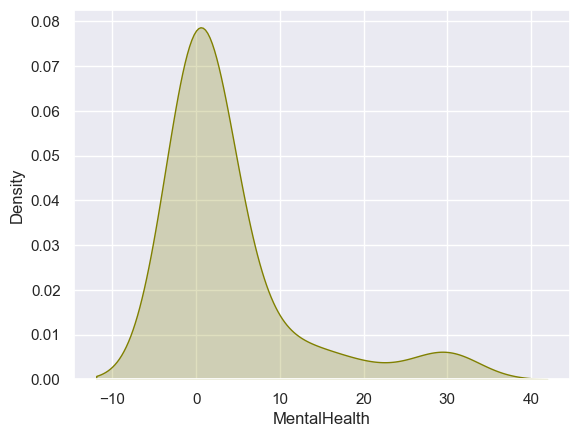

In [40]:
sns.kdeplot(df['MentalHealth'], shade=True, bw=0.5, color="olive")
plt.show()

c:\Users\ducey\Desktop\JUMP\Week 5\week_5_env\lib\site-packages\seaborn\distributions.py:1699: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.5 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)


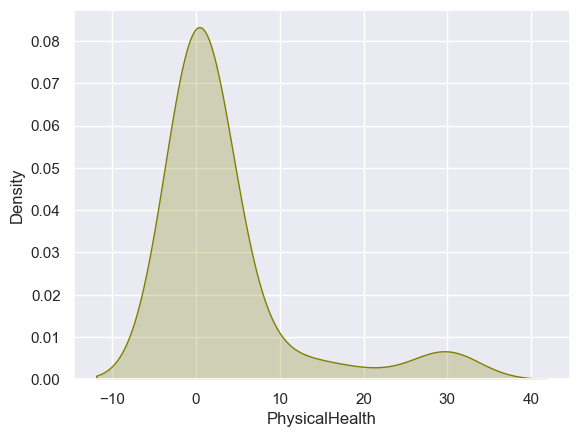

In [41]:
sns.kdeplot(df['PhysicalHealth'], shade=True, bw=0.5, color="olive")
plt.show()

In [42]:
ageheartcount=df2['HeartDisease'].groupby(df2["AgeCategory"]).value_counts()
agesmokecount = df2['Smoking'].groupby(df2["AgeCategory"]).value_counts()
agealccount = df2['AlcoholDrinking'].groupby(df2["AgeCategory"]).value_counts()
agestrokecount= df2['Stroke'].groupby(df2["AgeCategory"]).value_counts()
agediabeticcount = df2['Diabetic'].groupby(df2["AgeCategory"]).value_counts()
ageasthmacount = df2['Asthma'].groupby(df2["AgeCategory"]).value_counts()
agekidneyacount = df2['KidneyDisease'].groupby(df2["AgeCategory"]).value_counts()
ageskincount = df2['SkinCancer'].groupby(df2["AgeCategory"]).value_counts()
agediffwalkingcount = df2['DiffWalking'].groupby(df2["AgeCategory"]).value_counts()
ageactivitycount = df2['PhysicalActivity'].groupby(df2["AgeCategory"]).value_counts()

In [43]:
AgeDiseases = pd.concat([ageheartcount,agesmokecount, agealccount , agestrokecount,agediffwalkingcount, agediabeticcount,ageactivitycount,  ageasthmacount, agekidneyacount, ageskincount ], axis=1)
AgeDiseases = AgeDiseases.dropna().reset_index()
AgeDiseases = AgeDiseases.rename(columns = {"level_1": "Answer" } )
AgeDiseases = AgeDiseases.where(AgeDiseases["Answer"] == "Yes").dropna()
AgeDiseases= AgeDiseases.set_index("AgeCategory")
AgeDiseases

,Answer,HeartDisease,Smoking,AlcoholDrinking,Stroke,DiffWalking,Diabetic,PhysicalActivity,Asthma,KidneyDisease,SkinCancer
AgeCategory,,,,,,,,,,,
18-24,Yes,130.0,3284.0,1521.0,61.0,327.0,233.0,18062.0,3727.0,132.0,67.0
25-29,Yes,133.0,5154.0,1571.0,90.0,364.0,251.0,14338.0,2868.0,115.0,83.0
30-34,Yes,226.0,7172.0,1578.0,131.0,587.0,474.0,15758.0,2845.0,164.0,159.0
35-39,Yes,296.0,8642.0,1825.0,193.0,969.0,831.0,16960.0,2879.0,256.0,263.0
40-44,Yes,486.0,9081.0,1806.0,293.0,1321.0,1303.0,17066.0,3065.0,366.0,414.0
45-49,Yes,744.0,8725.0,1684.0,428.0,1906.0,2019.0,17289.0,3135.0,451.0,773.0
50-54,Yes,1383.0,9973.0,1959.0,685.0,3108.0,3072.0,19744.0,3472.0,700.0,1289.0
55-59,Yes,2202.0,12672.0,2218.0,1101.0,4650.0,4417.0,22972.0,3943.0,998.0,2188.0
60-64,Yes,3327.0,15436.0,2334.0,1483.0,5972.0,5672.0,25575.0,4498.0,1372.0,3338.0


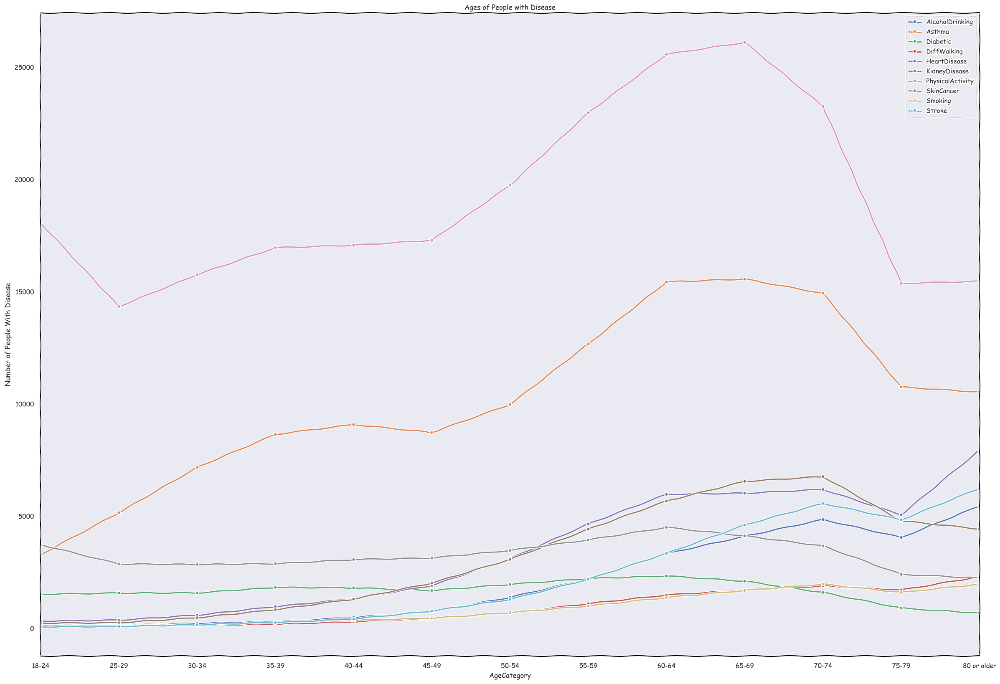

In [44]:
with plt.xkcd():
    plt.figure(figsize=(29,20))
    plt.xlabel('AgeCategory')
    plt.xlim(0,12)
    plt.ylabel('Number of People With Disease') 
    plt.title('Ages of People with Disease')
    for col in AgeDiseases[["HeartDisease", "Smoking","AlcoholDrinking","Stroke","DiffWalking","Diabetic","PhysicalActivity","Asthma","KidneyDisease","SkinCancer"]]:

        plt.plot(AgeDiseases.index, AgeDiseases[col], marker = ".")
        plt.legend(AgeDiseases.columns.difference(['Answer']))

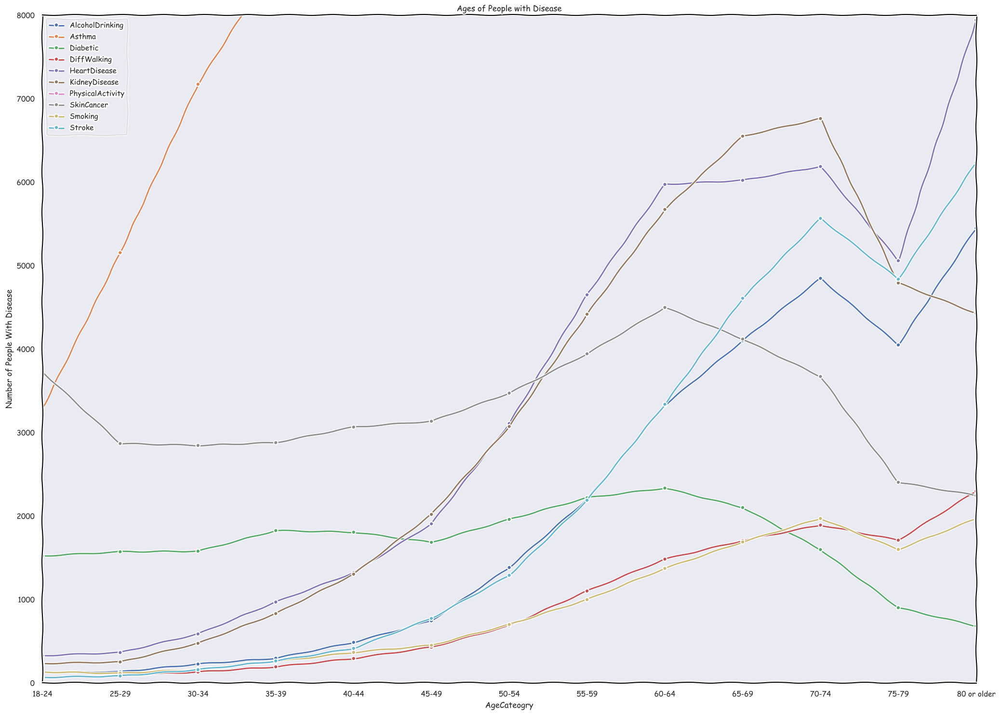

In [45]:
with plt.xkcd():
    plt.figure(figsize=(25,18))
    plt.axis([0, 12, 0, 8000])
    plt.xlabel('AgeCateogry')
    plt.ylabel('Number of People With Disease') 
    plt.title('Ages of People with Disease')
    for col in AgeDiseases[["HeartDisease", "Smoking","AlcoholDrinking","Stroke","DiffWalking","Diabetic","PhysicalActivity","Asthma","KidneyDisease","SkinCancer"]]:

        plt.plot(AgeDiseases.index, AgeDiseases[col], marker = ".")
        plt.legend(AgeDiseases.columns.difference(['Answer']))

In [46]:
ageheartcountpercent=df2['HeartDisease'].groupby(df2["AgeCategory"]).value_counts(normalize=True)
agesmokecountpercent = df2['Smoking'].groupby(df2["AgeCategory"]).value_counts(normalize=True)
agealccountpercent = df2['AlcoholDrinking'].groupby(df2["AgeCategory"]).value_counts(normalize=True)
agestrokecountpercent= df2['Stroke'].groupby(df2["AgeCategory"]).value_counts(normalize=True)
agediabeticcountpercent = df2['Diabetic'].groupby(df2["AgeCategory"]).value_counts(normalize=True)
ageasthmacountpercent = df2['Asthma'].groupby(df2["AgeCategory"]).value_counts(normalize=True)
agekidneyacountpercent = df2['KidneyDisease'].groupby(df2["AgeCategory"]).value_counts(normalize=True)
ageskincountpercent = df2['SkinCancer'].groupby(df2["AgeCategory"]).value_counts(normalize=True)
agediffwalkingcountpercent = df2['DiffWalking'].groupby(df2["AgeCategory"]).value_counts(normalize=True)
ageactivitycountpercent = df2['PhysicalActivity'].groupby(df2["AgeCategory"]).value_counts(normalize=True)

In [47]:
AgeDiseasespercent = pd.concat([ageheartcountpercent,agesmokecountpercent, agealccountpercent , agestrokecountpercent,agediffwalkingcountpercent, agediabeticcountpercent,ageactivitycountpercent,  ageasthmacountpercent, agekidneyacountpercent, ageskincountpercent ], axis=1)
AgeDiseasespercent = AgeDiseasespercent.dropna().reset_index()
AgeDiseasespercent = AgeDiseasespercent.rename(columns = {"level_1": "Answer" } )
AgeDiseasespercent = AgeDiseasespercent.where(AgeDiseasespercent["Answer"] == "Yes").dropna()
AgeDiseasespercent= AgeDiseasespercent.set_index("AgeCategory")
AgeDiseasespercent

,Answer,HeartDisease,Smoking,AlcoholDrinking,Stroke,DiffWalking,Diabetic,PhysicalActivity,Asthma,KidneyDisease,SkinCancer
AgeCategory,,,,,,,,,,,
18-24,Yes,0.006172,0.155906,0.072209,0.002896,0.015524,0.011062,0.857482,0.176937,0.006267,0.003181
25-29,Yes,0.007844,0.303981,0.092657,0.005308,0.021469,0.014804,0.845650,0.169154,0.006783,0.004895
30-34,Yes,0.012051,0.382445,0.084147,0.006986,0.031302,0.025276,0.840292,0.151709,0.008745,0.008479
35-39,Yes,0.014404,0.420535,0.088808,0.009392,0.047153,0.040438,0.825304,0.140097,0.012457,0.012798
40-44,Yes,0.023136,0.432305,0.085975,0.013948,0.062887,0.062030,0.812435,0.145911,0.017424,0.019709
45-49,Yes,0.034143,0.400395,0.077280,0.019641,0.087467,0.092653,0.793401,0.143867,0.020697,0.035473
50-54,Yes,0.054487,0.392916,0.077181,0.026988,0.122449,0.121031,0.777874,0.136790,0.027579,0.050784
55-59,Yes,0.073999,0.425849,0.074537,0.037000,0.156266,0.148436,0.771986,0.132507,0.033538,0.073529
60-64,Yes,0.098765,0.458232,0.069287,0.044024,0.177284,0.168379,0.759217,0.133527,0.040729,0.099092


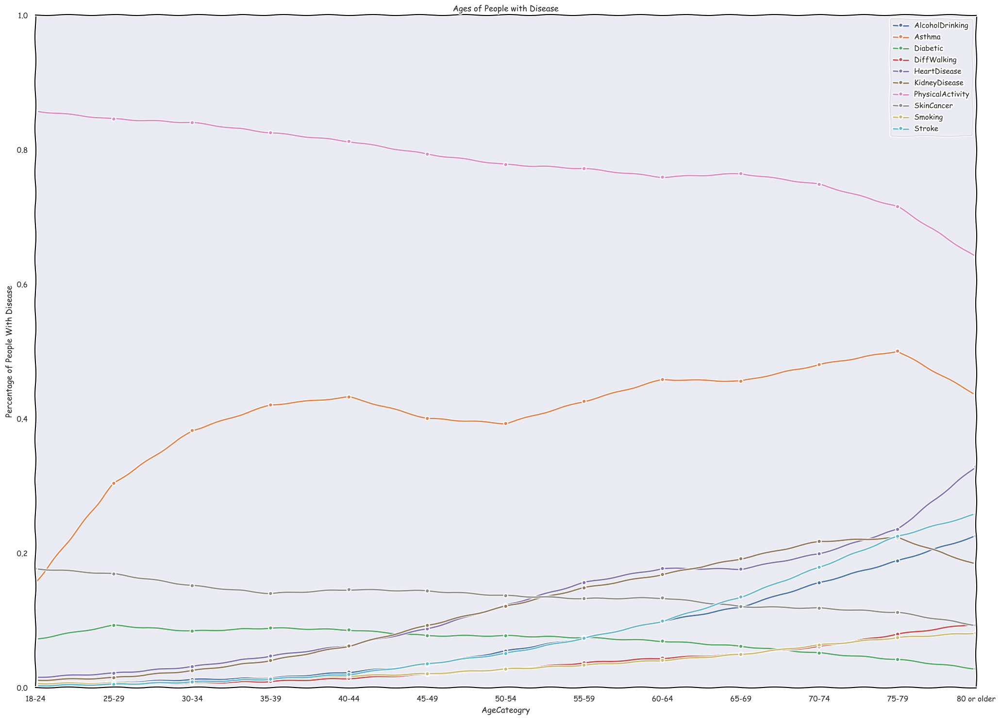

In [48]:
with plt.xkcd():
    plt.figure(figsize=(25,18))
    plt.axis([0, 12, 0, 1])
    plt.xlabel('AgeCateogry')
    plt.ylabel('Percentage of People With Disease') 
    plt.title('Ages of People with Disease')
    for col in AgeDiseasespercent[["HeartDisease", "Smoking","AlcoholDrinking","Stroke","DiffWalking","Diabetic","PhysicalActivity","Asthma","KidneyDisease","SkinCancer"]]:

        plt.plot(AgeDiseasespercent.index, AgeDiseasespercent[col], marker = ".")
        plt.legend(AgeDiseasespercent.columns.difference(['Answer']))

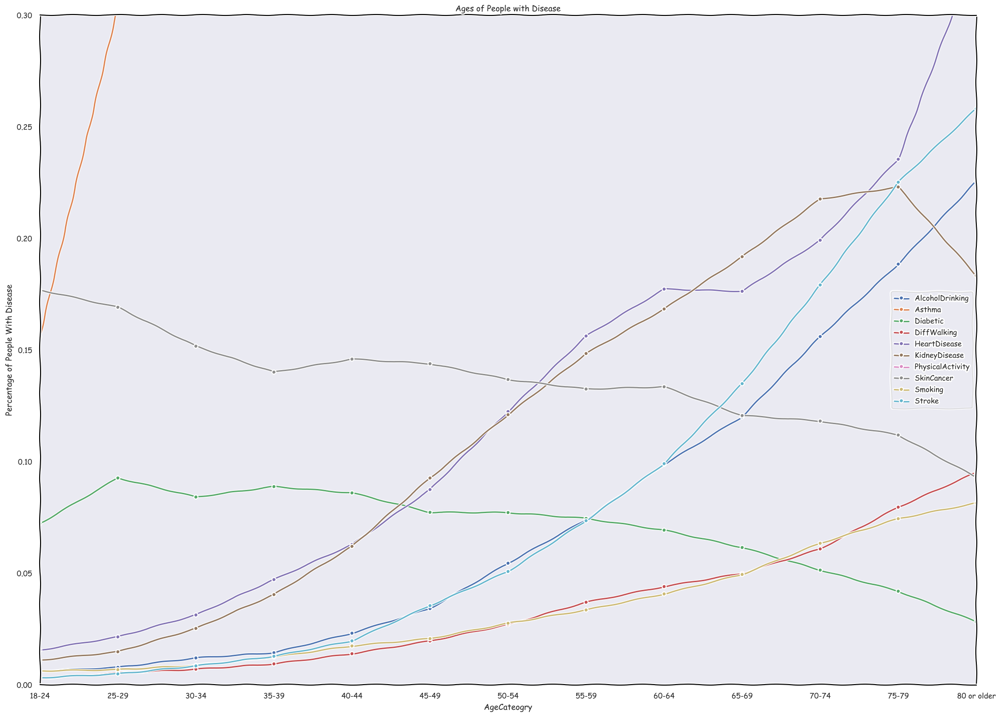

In [49]:
with plt.xkcd():
    plt.figure(figsize=(25,18))
    plt.axis([0, 12, 0, .3])
    plt.xlabel('AgeCateogry')
    plt.ylabel('Percentage of People With Disease') 
    plt.title('Ages of People with Disease')
    for col in AgeDiseasespercent[["HeartDisease", "Smoking","AlcoholDrinking","Stroke","DiffWalking","Diabetic","PhysicalActivity","Asthma","KidneyDisease","SkinCancer"]]:

        plt.plot(AgeDiseasespercent.index, AgeDiseasespercent[col], marker = ".")
        plt.legend(AgeDiseasespercent.columns.difference(['Answer']))

In [50]:
grouped_multiple = df.groupby(['AgeCategory', 'Diabetic']).agg({'SleepTime': ['mean', 'min', 'max']})
grouped_multiple.columns = ['sleeptime_mean', 'sleeptime_min', 'sleeptime_max']
grouped_multiple = grouped_multiple.reset_index()
grouped_multiple

,AgeCategory,Diabetic,sleeptime_mean,sleeptime_min,sleeptime_max
0,18-24,No,7.188716,1.0,24.0
1,18-24,"No, borderline diabetes",7.011561,2.0,10.0
2,18-24,Yes,7.270386,2.0,24.0
3,18-24,Yes (during pregnancy),6.816327,3.0,10.0
4,25-29,No,6.989747,1.0,24.0
5,25-29,"No, borderline diabetes",6.960000,2.0,13.0
6,25-29,Yes,6.852590,2.0,18.0
7,25-29,Yes (during pregnancy),6.875000,1.0,10.0
8,30-34,No,6.879172,1.0,24.0
9,30-34,"No, borderline diabetes",6.946602,2.0,12.0


Text(0.5, 1.0, 'age and average/Mean sleeptime')

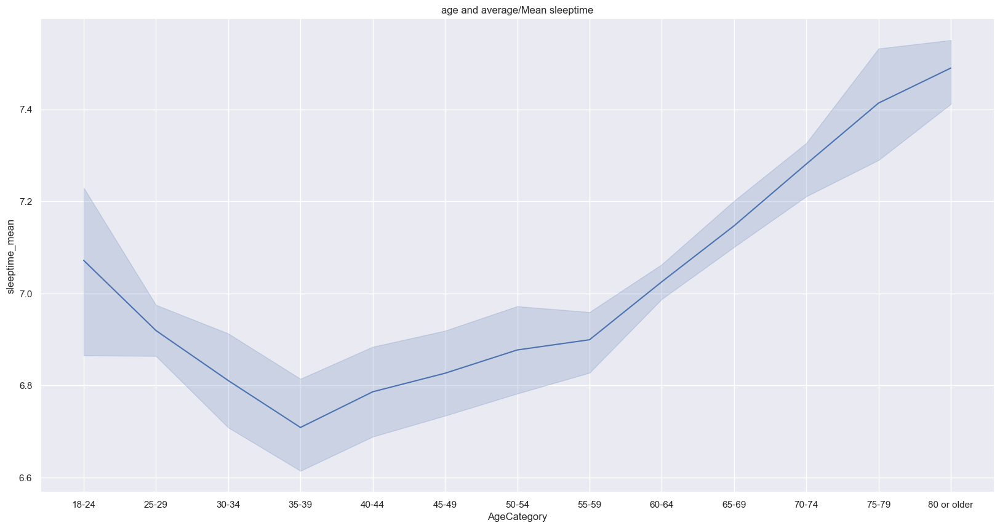

In [51]:
plt.figure(figsize=(20, 10))
sns.lineplot(data=grouped_multiple, x="AgeCategory", y="sleeptime_mean")
plt.title('age and average/Mean sleeptime')

Text(0.5, 1.0, 'age and minimum sleeptime')

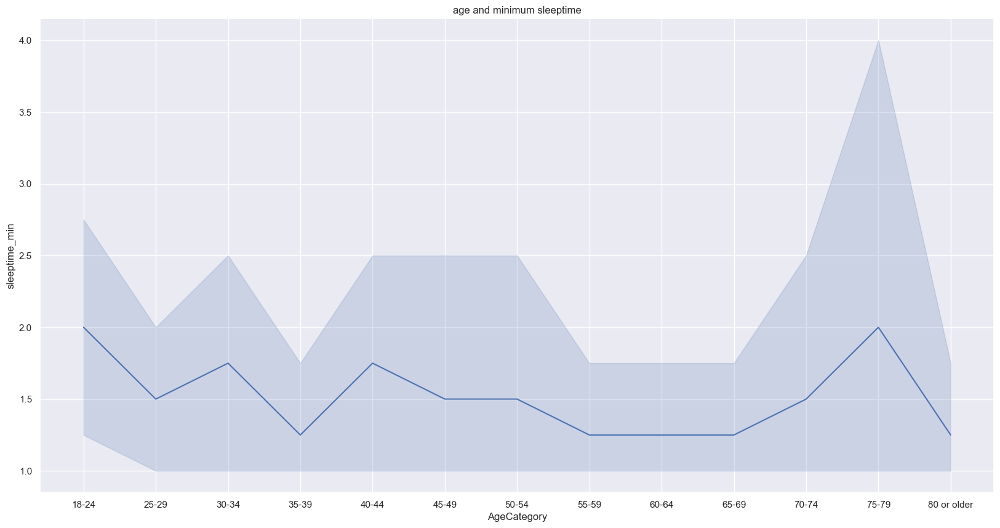

In [52]:
plt.figure(figsize=(20, 10))
sns.lineplot(data=grouped_multiple, x="AgeCategory", y="sleeptime_min")
plt.title('age and minimum sleeptime')

Text(0.5, 1.0, 'age and maximum sleeptime')

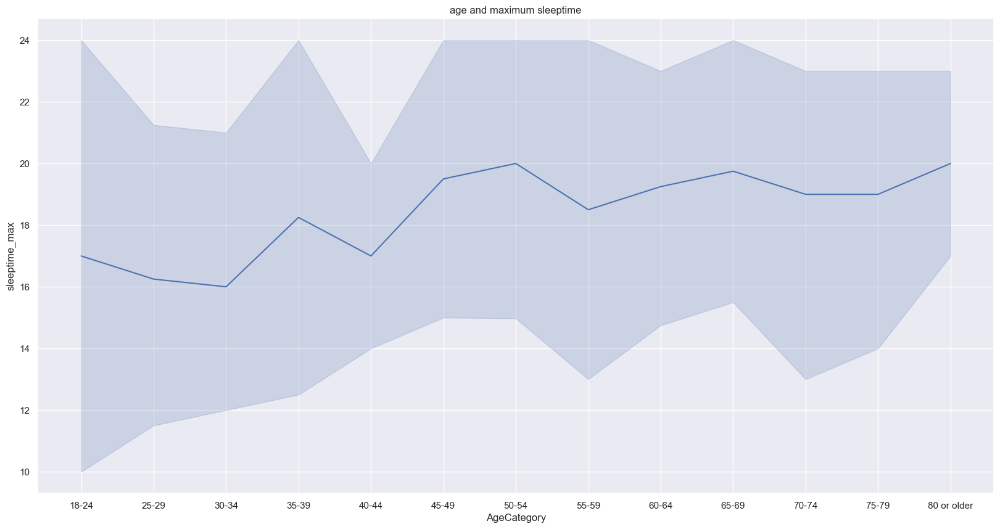

In [53]:
plt.figure(figsize=(20, 10))
sns.lineplot(data=grouped_multiple, x="AgeCategory", y="sleeptime_max")
plt.title('age and maximum sleeptime')

Text(0.5, 1.0, 'Diabetes and maximum sleeptime')

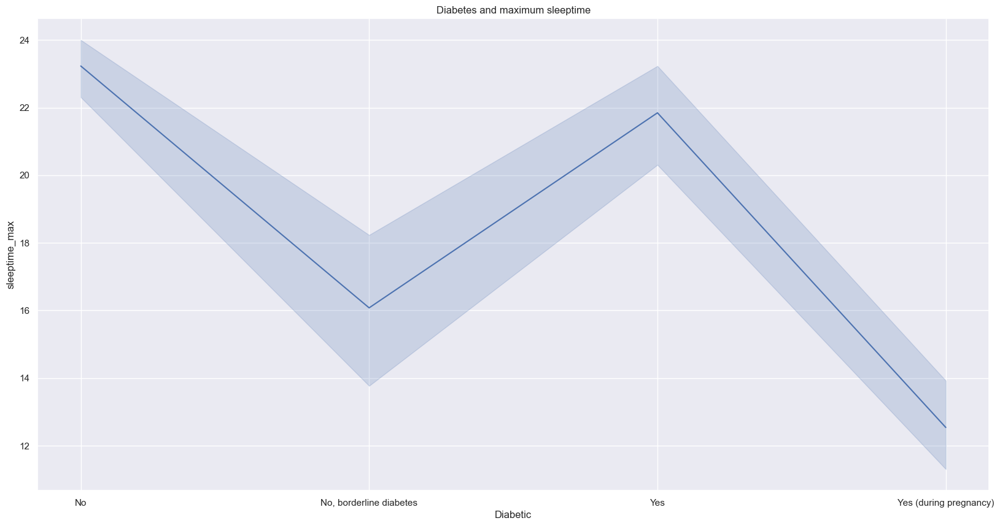

In [54]:
plt.figure(figsize=(20, 10))
sns.lineplot(data=grouped_multiple, x="Diabetic", y="sleeptime_max")
plt.title('Diabetes and maximum sleeptime')

Text(0.5, 1.0, 'Diabetes and Minimum sleeptime')

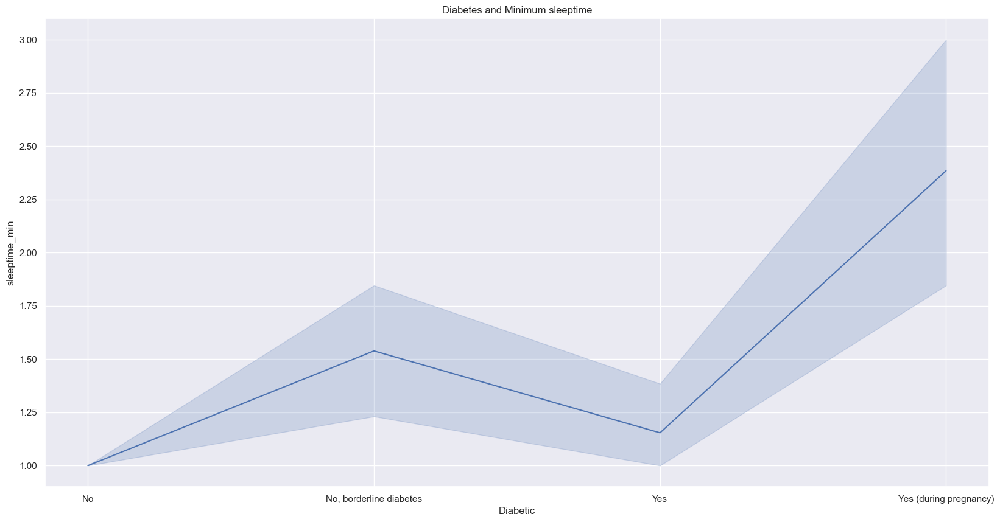

In [55]:
plt.figure(figsize=(20, 10))
sns.lineplot(data=grouped_multiple, x="Diabetic", y="sleeptime_min")
plt.title('Diabetes and Minimum sleeptime')

Text(0.5, 1.0, 'Diabetes and mean/average sleeptime')

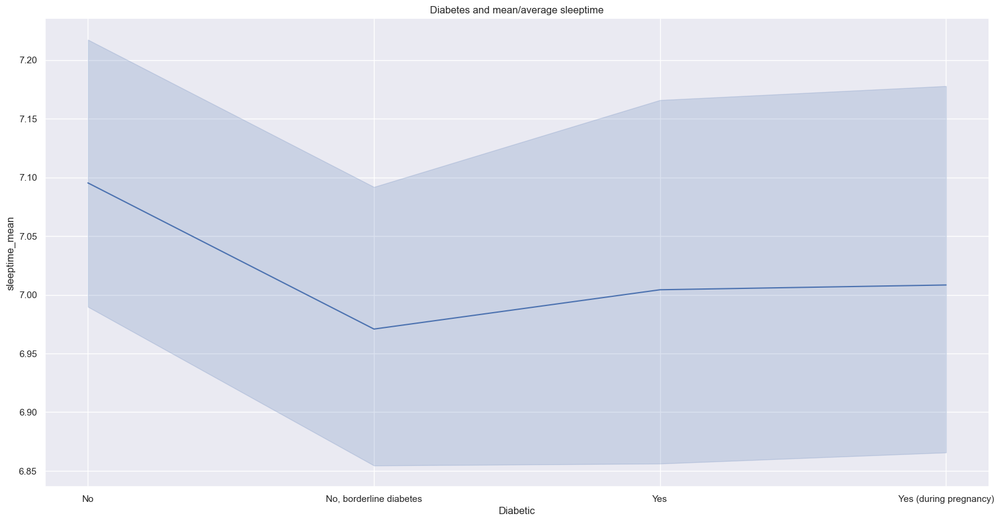

In [56]:
plt.figure(figsize=(20, 10))
sns.lineplot(data=grouped_multiple, x="Diabetic", y="sleeptime_mean")
plt.title('Diabetes and mean/average sleeptime')

In [57]:
grouped_genhealth = df.groupby(['GenHealth']).agg({'BMI': ['mean', 'min', 'max']})
grouped_genhealth.columns = ['bmi_mean', 'bmi_min', 'bmi_max']
grouped_genhealth = grouped_genhealth.reset_index()
grouped_genhealth

,GenHealth,bmi_mean,bmi_min,bmi_max
0,Excellent,26.099836,12.13,94.85
1,Fair,30.646690,12.48,88.60
2,Good,29.495961,12.02,85.17
3,Poor,30.402139,12.02,93.97
4,Very good,27.761608,12.16,94.66


Text(0.5, 1.0, 'General Health and mean/average Body Mass Index')

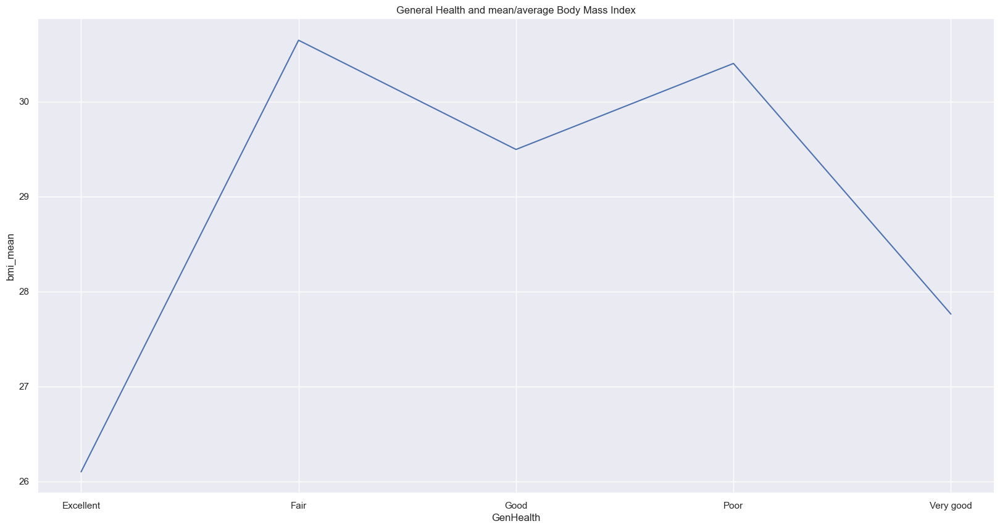

In [58]:
plt.figure(figsize=(20, 10))
sns.lineplot(data=grouped_genhealth, x="GenHealth", y="bmi_mean")
plt.title('General Health and mean/average Body Mass Index')

Text(0.5, 1.0, 'General Health and maximum Body Mass Index')

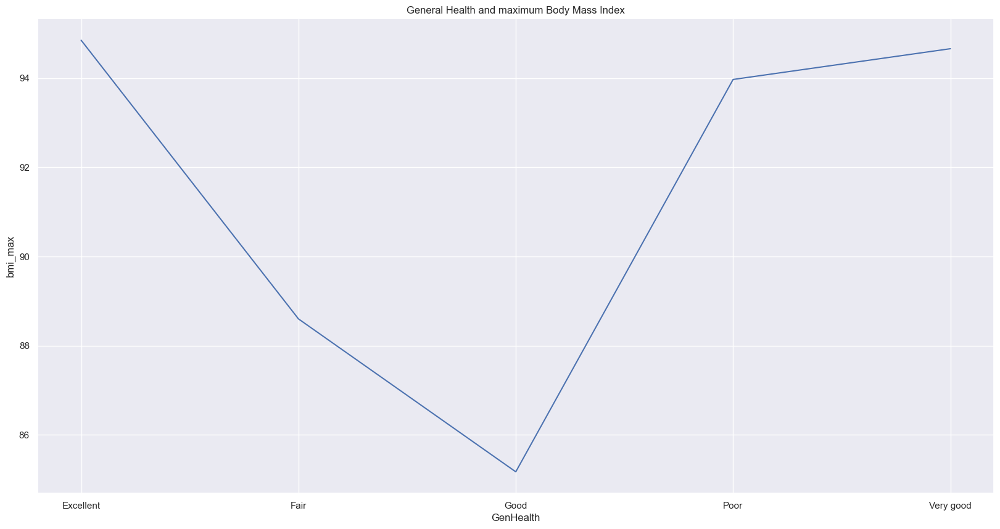

In [59]:
plt.figure(figsize=(20, 10))
sns.lineplot(data=grouped_genhealth, x="GenHealth", y="bmi_max")
plt.title('General Health and maximum Body Mass Index')

Text(0.5, 1.0, 'General Health and minimum Body Mass Index')

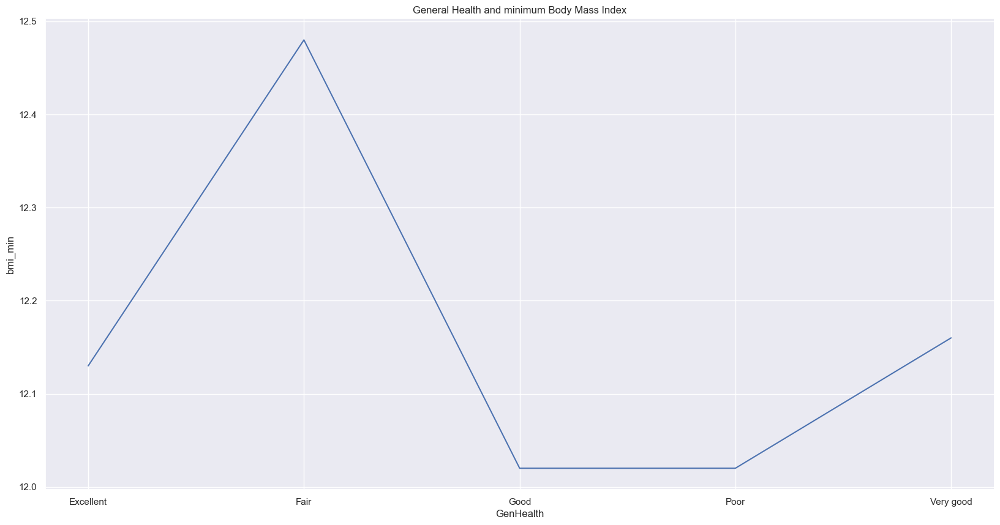

In [60]:
plt.figure(figsize=(20, 10))
sns.lineplot(data=grouped_genhealth, x="GenHealth", y="bmi_min")
plt.title('General Health and minimum Body Mass Index')

In [61]:
grouped_age_bmi = df.groupby(['AgeCategory']).agg({'BMI': ['mean', 'min', 'max']})
grouped_age_bmi.columns = ['bmi_mean', 'bmi_min', 'bmi_max']
grouped_age_bmi = grouped_age_bmi.reset_index()
grouped_age_bmi

,AgeCategory,bmi_mean,bmi_min,bmi_max
0,18-24,25.762770,12.02,83.33
1,25-29,27.688610,12.85,85.91
2,30-34,28.440007,12.08,87.05
3,35-39,28.838634,12.16,94.85
4,40-44,29.199764,12.40,91.55
5,45-49,29.487189,12.88,82.50
6,50-54,29.425097,12.26,94.66
7,55-59,29.098977,12.02,91.55
8,60-64,28.821778,12.13,84.44
9,65-69,28.674776,12.48,93.86


Text(0.5, 1.0, 'Age Category and Mean/Average Body Mass Index')

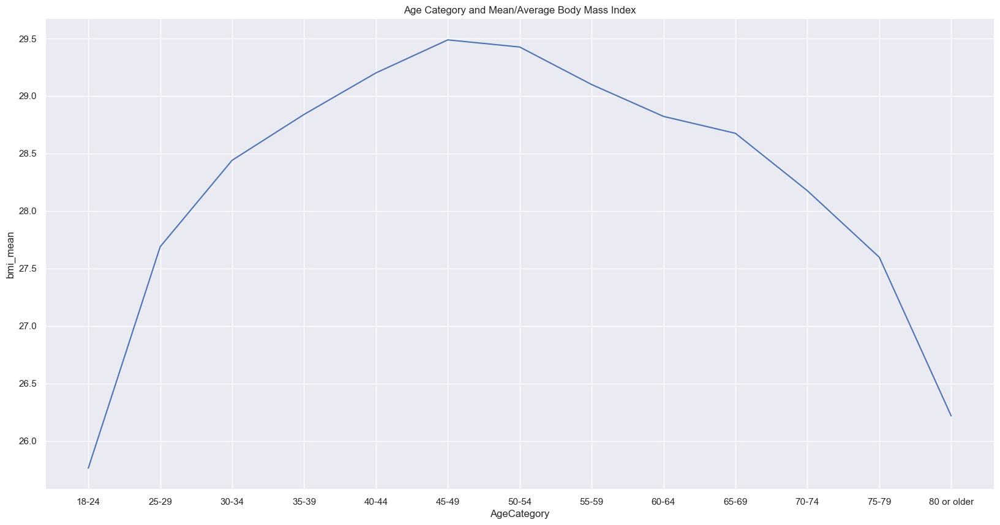

In [62]:
plt.figure(figsize=(20, 10))
sns.lineplot(data=grouped_age_bmi, x="AgeCategory", y="bmi_mean")
plt.title('Age Category and Mean/Average Body Mass Index')

Text(0.5, 1.0, 'Age Category and Maximum Body Mass Index')

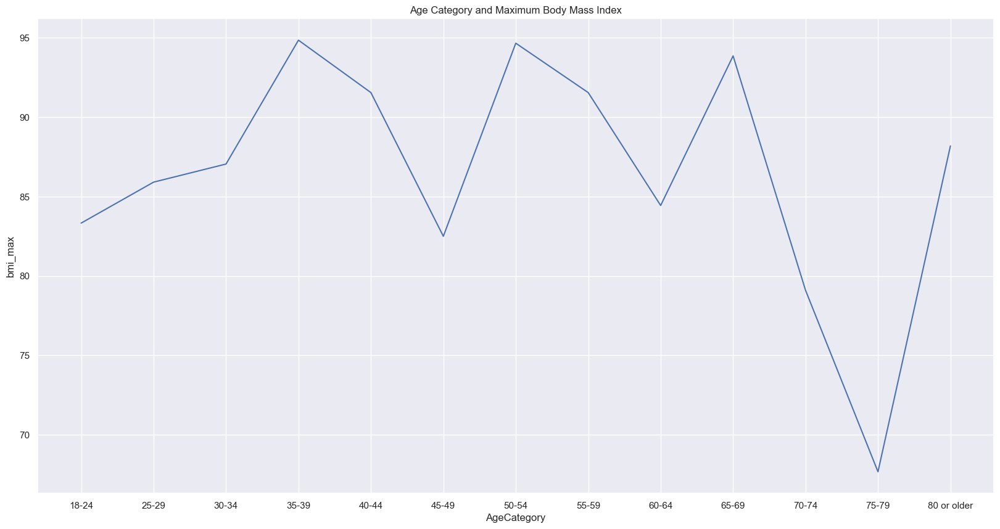

In [63]:
plt.figure(figsize=(20, 10))
sns.lineplot(data=grouped_age_bmi, x="AgeCategory", y="bmi_max")
plt.title('Age Category and Maximum Body Mass Index')

Text(0.5, 1.0, 'Age Category and Minimum Body Mass Index')

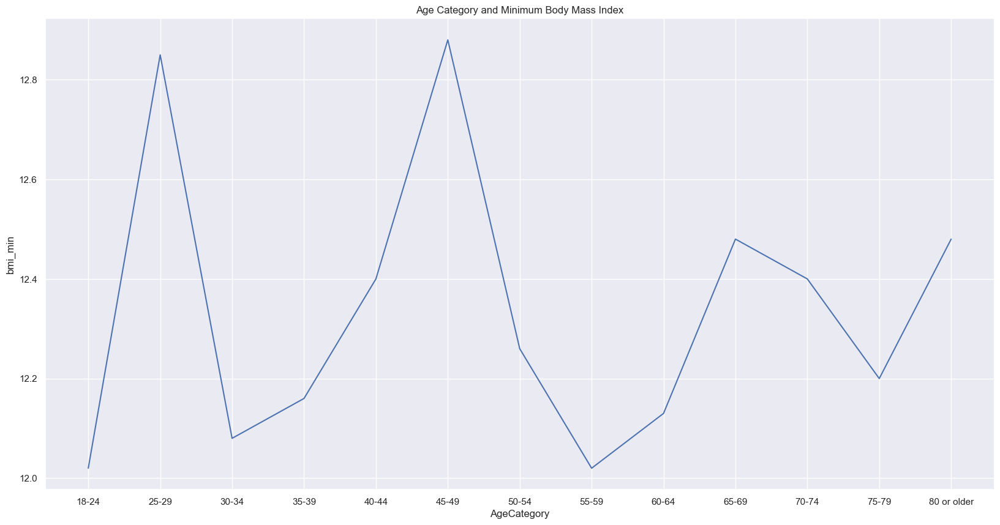

In [64]:
plt.figure(figsize=(20, 10))
sns.lineplot(data=grouped_age_bmi, x="AgeCategory", y="bmi_min")
plt.title('Age Category and Minimum Body Mass Index')

In [65]:
grouped_race_bmi = df.groupby(['Race']).agg({'BMI': ['mean', 'min', 'max']})
grouped_race_bmi.columns = ['bmi_mean', 'bmi_min', 'bmi_max']
grouped_race_bmi = grouped_race_bmi.reset_index()
grouped_race_bmi

,Race,bmi_mean,bmi_min,bmi_max
0,American Indian/Alaskan Native,29.627678,12.97,81.67
1,Asian,25.218303,12.83,83.33
2,Black,30.169993,12.02,92.53
3,Hispanic,28.818086,12.50,86.80
4,Other,28.748967,12.65,93.86
5,White,28.153422,12.02,94.85


Text(0.5, 1.0, 'Race and Mean/Average Body Mass Index')

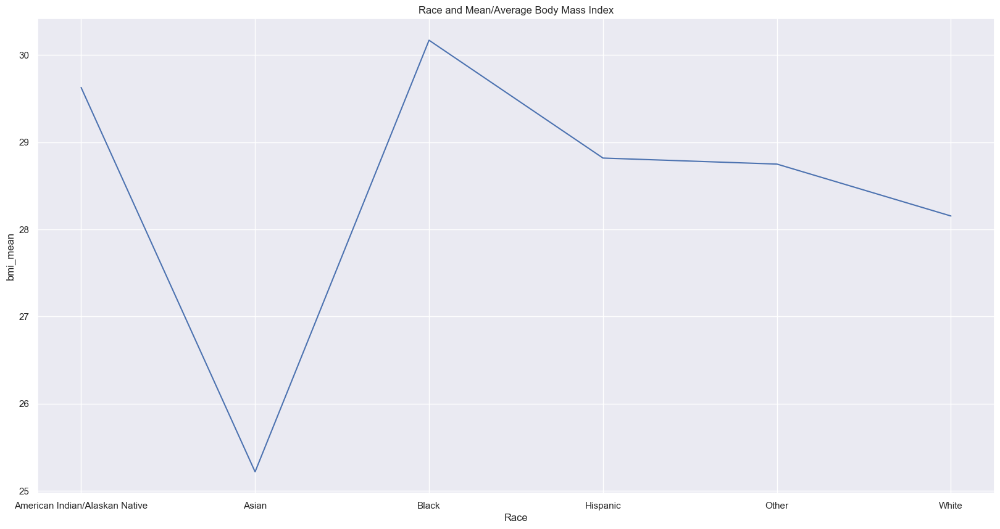

In [66]:
plt.figure(figsize=(20, 10))
sns.lineplot(data=grouped_race_bmi, x="Race", y="bmi_mean")
plt.title('Race and Mean/Average Body Mass Index')

Text(0.5, 1.0, 'Race and Maximum Body Mass Index')

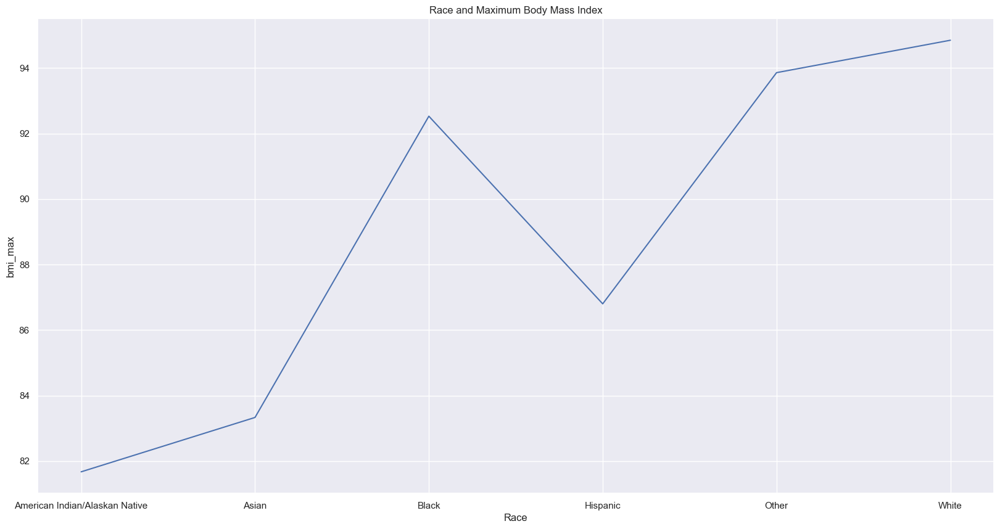

In [67]:
plt.figure(figsize=(20, 10))
sns.lineplot(data=grouped_race_bmi, x="Race", y="bmi_max")
plt.title('Race and Maximum Body Mass Index')

Text(0.5, 1.0, 'Race and Minimum Body Mass Index')

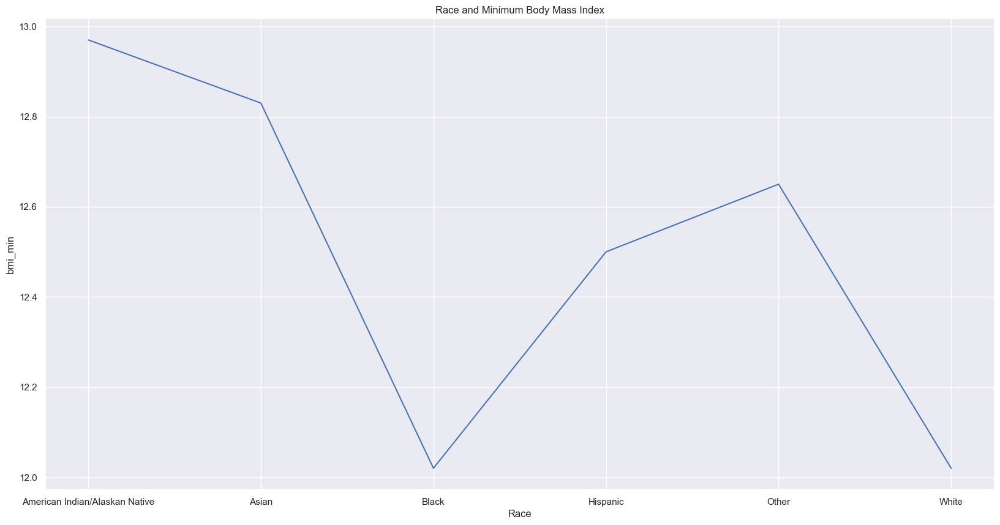

In [68]:
plt.figure(figsize=(20, 10))
sns.lineplot(data=grouped_race_bmi, x="Race", y="bmi_min")
plt.title('Race and Minimum Body Mass Index')